In [ ]:
#Connection au Drive pour la sauvegardes des fichiers
#Connection to Drive for file backups
from google.colab import drive
drive.mount('content', force_remount=True)
#set the root directory to where the data was stored
#root_dir = '/content/drive/My Drive/Data_Abj'

Mounted at content


In [ ]:
#Visualiser le contenu du dossier source
#View Source Folder Contents
!pwd
import os
os.listdir()

/content


['.config', 'content', 'sample_data']

# ***PARTIE 1 : Installation et Configuration des Bibliothèques Python***


**1.   Connexion à notre Dossier de Travail**

**2.   Installation de la bibliothèque HTTP de Python**

**3.   Installation du package sentinelhub et eo-learn**

**4.   Importation des modules**

***1.   Connexion à notre Dossier de Travail***

Pour sauver nos données en ligne (Google Drive)

In [ ]:
os.chdir("/content/content/MyDrive/Mes recherches/Abidjan_data/Abidjan_LULC/2022") # Connexion à notre Dossier de travail Sentinel_Data_2 / Connecting to our Sentinel_Data_2 Working Folder
os.listdir() #Voir le contenu de notre dossier _LULC Abj 2022 / View the contents of our _LULC Abj 2022 folder

['data',
 'eopatches',
 'eopatches_sampl',
 'results',
 'tmp',
 'eoexecution-report-2023_06_20-12_21_14',
 'output_geotiffs',
 'Copie de 2022 LCLU_Abidjan_finalis_spiritus (1).ipynb',
 'Copie de 2022 LCLU_Abidjan_finalis_spiritus.ipynb',
 'eoexecution-report-2023_10_30-17_50_14',
 '2022 LCLU_Abidjan_finalis_spiritus.ipynb']

***2.   Installation de la bibliothèque HTTP de Python***

Requests vous permet d'envoyer très facilement des [requêtes HTTP/1.1.](https://fr.wikipedia.org/wiki/Hypertext_Transfer_Protocol)



---

***2. Installation of the Python HTTP library***

Requests allows you to very easily send [HTTP/1.1 requests.](https://fr.wikipedia.org/wiki/Hypertext_Transfer_Protocol)

In [ ]:
!pip install requests #Installation de la Bibliothèque HTTP de Pyhton Version 2.27 plus adapté à notre projet / Installation of the HTTP Library of Python Version 2.27 more suitable for our project /

***3. Installation du package sentinelhub et eo-learn***

*   Le package sentinelhub Python est l'interface Python officielle pour les services Sentinel Hub. Il prend en charge la plupart des services décrits dans la documentation Sentinel Hub et tout type de collectes de données satellitaires, y compris Sentinel, Landsat, MODIS, DEM et les collections personnalisées produites par les utilisateurs.

*  eo-learn est une collection de packages Python open source qui ont été développés pour accéder et traiter de manière transparente des séquences d'images spatio-temporelles acquises par n'importe quelle flotte de satellites de manière rapide et automatique.



---

***3. Installing the sentinelhub and eo-learn package***

* The sentinelhub Python package is the official Python interface for Sentinel Hub services. It supports most of the services described in the Sentinel Hub documentation and all types of satellite data collections, including Sentinel, Landsat, MODIS, DEM, and user-generated custom collections.

* eo-learn is a collection of open source Python packages that have been developed to seamlessly access and process spatiotemporal image sequences acquired by any satellite fleet in a fast and automatic way.

In [ ]:
!pip install sentinelhub==3.8.3 # Installation du package sentinelhub Python Version: 3.7.0 pour des soucis rencontrés avec les mises à jours / Installing the sentinelhub Python Version: 3.7.0 package for issues encountered with updates
!pip install eo-learn==1.4.1 # Installation de la bibliothèque eo-learn version : 1.0.2 Compatible avec celle de SentinelHb ci-dessus /nstallation of the eo-learn library version: 1.0.2 Compatible with that of SentinelHb above

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 220.1/220.1 kB 2.1 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 137.6/137.6 kB 13.4 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.4/49.4 kB 6.2 MB/s eta 0:00:00
  Created wheel for sentinelhub: filename=sentinelhub-3.8.3-py3-none-any.whl size=244283 sha256=2796392c4a2b39b966a22c61430f96913fbe8ea41841b2b9ec7a442119f2723a
  Stored in directory: /root/.cache/pip/wheels/d8/5b/1c/55280857fc9a934e49aad9d70aff35535f67a7652fb2e3c157
  Created wheel for utm: filename=utm-0.7.0-py3-none-any.whl size=6085 sha256=6bc0e570cac92015e1acb495bec747fe43a8b47761873f25e3c1aa3d02e2921a
  Stored in directory: /root/.cache/pip/wheels/2f/a1/c8/543df0e8f5e824c3e92a432e32deb9cd89ae686095ee8cfcbe
Successfully built sentinelhub utm
     ━━━━━━━━━━━━━━━━━━━━━

In [ ]:
# Tout d'abord, quelques importations nécessaires
# Firstly, some necessary imports

# Lié au cahier Jupyter
# Jupyter notebook related

# Extension IPython pour recharger les modules avant d'exécuter le code utilisateur / IPython extension to reload modules before executing user code.
# %reload_ext autoreload
# %autoreload 2
# %matplotlib inline

# Built-in modules
import os # Diverses interfaces pour le système d'exploitation / Various interfaces for the operating system
import datetime # Importation des Types de base pour la date et l'heure / Importing Base Types for Date and Time
import itertools # Itertool de Python est un module qui fournit diverses fonctions qui fonctionnent sur des itérateurs pour produire des itérateurs complexes. / Python’s Itertool is a module that provides various functions that work on iterators to produce complex iterators.
from aenum import MultiValueEnum # Énumérations avancées (compatibles avec l'énumération stdlib de Python), NamedTuples et NamedConstants / Advanced Enumerations (compatible with Python’s stdlib Enum), NamedTuples, and NamedConstants
from enum import Enum

# Bases de la gestion et de la visualisation des données Python
# Basics of Python data handling and visualization
import numpy as np # NumPy, qui signifie Numerical Python, est une bibliothèque de calcul scientifique. / NumPy, which stands for Numerical Python, is a scientific computing library.
import geopandas as gpd # GeoPandas est un projet open source pour ajouter la prise en charge des données géographiques aux objets pandas / GeoPandas is an open source project to add support for geographic data to pandas objects.
# Importation d'une collection de fonctions de style de commande qui font fonctionner matplotlib comme MATLAB / Import a collection of command style functions that make matplotlib work like MATLAB
import matplotlib.pyplot as plt
import matplotlib as mpl
from matplotlib.colors import ListedColormap, BoundaryNorm
from shapely.geometry import Polygon
from tqdm.auto import tqdm

# Machine learning
# La méthode préférée pour installer LightGBM est via pip / The preferred method to install LightGBM is via pip
import lightgbm as lgb
# Joblib est un ensemble d'outils permettant de fournir un pipelining léger en Python /Joblib is a set of tools for providing lightweight pipelining in Python
import joblib
# plugin sklearn pour le score de classification de précision / sklearn plugin for accuracy classification score.
from sklearn import metrics

from sklearn import preprocessing
"""Le package sklearn.preprocessing fournit plusieurs fonctions utilitaires et classes de transformateurs communes pour transformer les vecteurs de caractéristiques brutes en une représentation plus adaptée aux estimateurs en aval."""
"""The sklearn.preprocessing package provides several common utility functions and transformer classes to change raw feature vectors into a representation that is more suitable for the downstream estimators"""

'The sklearn.preprocessing package provides several common utility functions and transformer classes to change raw feature vectors into a representation that is more suitable for the downstream estimators'

In [ ]:
"""importation des sous-packages principaux qui implémentent les blocs de construction de base (EOPatch, EOTask et EOWorkflow)
    et les fonctionnalités couramment utilisées"""
from eolearn.core import(
    EOTask,
    EOPatch,
    EOWorkflow,
    linearly_connect_tasks,
    FeatureType,
    OverwritePermission,
    LoadTask,
    SaveTask,
    EOExecutor,
    MergeFeatureTask,
)


from eolearn.io import SentinelHubInputTask, VectorImportTask, ExportToTiffTask
from eolearn.geometry import VectorToRasterTask, ErosionTask
from eolearn.features import LinearInterpolationTask
from eolearn.ml_tools import FractionSamplingTask
from sentinelhub import UtmZoneSplitter, DataCollection, SHConfig, CRS

In [ ]:
from eolearn.features import LinearInterpolationTask, SimpleFilterTask, NormalizedDifferenceIndexTask
from eolearn.features import LinearInterpolationTask

***4. Configuration du concentrateur sentinelle***

*   Pour utiliser les services Sentinel Hub, il est necessaire d'avoir un compte Sentinel Hub, où a partir de se compte nous la possibilité de téléchager les données.


---

***4. Configuration of the sentinel hub***

* To use the Sentinel Hub services, it is necessary to have a Sentinel Hub account, where from you can download the data.

In [ ]:
# Configuration de base pour le téléchargement des données Sentinelle
# Le package contient un fichier de configuration config.json

from sentinelhub import SHConfig

config = SHConfig()

"""Par défaut les paramètres instance_id, sh_client_idet sh_client_secretseront vides.
Le paramètre instance_idest utilisé lors de l'utilisation des points de terminaison OGC des services Sentinel Hub . Il s'agit de l'identifiant
d'une configuration que les utilisateurs peuvent configurer dans le tableau de bord Sentinel Hub sous « Utilitaire de configuration »."""

"""Les paramètres sh_client_idet peuvent également être créés dans le tableau de bord Sentinel Hub sous « Paramètres utilisateur ».
Les deux paramètres sont nécessaires lors de l'accès aux points de terminaison protégés du service (processus, catalogue, lot, BYOC et autres API).
Il existe un cadre "clients OAuth" dans lequel nous pouvons créer un nouveau client OAuth.sh_client_secret """

config.instance_id = '07a1416f-3ddc-43fd-abd6-d6558b7102d7'
config.sh_client_id = '591c9e2d-8876-4404-bf06-22cc2de44a3c'
config.sh_client_secret = 'Y2m7LPJsVrMwlrHzIk9KBDB43LiLzyVavRyso52p'

config.save() # Nous enregistrons les configurations dans le fichier package config.json

In [ ]:
CLIENT_ID = '591c9e2d-8876-4404-bf06-22cc2de44a3c'
CLIENT_SECRET = 'Y2m7LPJsVrMwlrHzIk9KBDB43LiLzyVavRyso52p'
config = SHConfig()

config.instance_id = '07a1416f-3ddc-43fd-abd6-d6558b7102d7'
config.sh_client_id = CLIENT_ID
config.sh_client_secret = CLIENT_SECRET
config.save()
if CLIENT_ID and CLIENT_SECRET:
  config.sh_client_id = CLIENT_ID
  config.sh_client_secret = CLIENT_SECRET

if config.sh_client_id == "" or config.sh_client_secret == "" or config.instance_id == "":
  print("Warning! To use Sentinel Hub services, please provide the credentials (client ID and client secret).")

# Définition de la zone d'intérêt (AOI)
---


> Obtention de la frontière du la ville d'Abidjan




In [ ]:
# Dossier dans lequel les données d'exécution du notebook sont stockées
# Folder where data for running the notebook is stored
DATA_FOLDER = os.path.join(".", "data")

# Emplacements des données collectées et des résultats intermédiaires
# Locations for collected data and intermediate results

# Pour les eopatchs / For eopatches
EOPATCH_FOLDER = os.path.join(".", "eopatches")
# Pour stocker les données d'entrainement / To store training data
EOPATCH_SAMPLES_FOLDER = os.path.join(".", "eopatches_sampl")
# Pour stocker les resultats des données / To store data results
RESULTS_FOLDER = os.path.join(".", "results")
for folder in (DATA_FOLDER, EOPATCH_FOLDER, EOPATCH_SAMPLES_FOLDER, RESULTS_FOLDER):
    os.makedirs(folder, exist_ok=True)

(-4.33063875, -3.69693425, 5.16194205, 5.66123095)

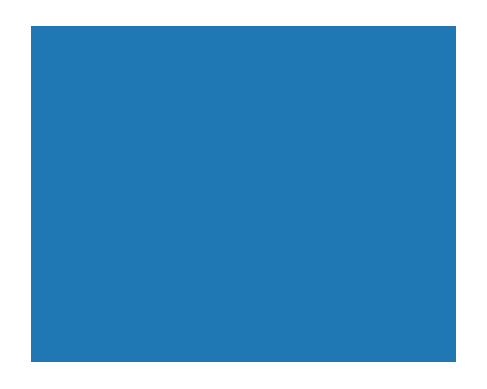

In [ ]:
# Charger le fichier geojson
# Load geojson file
abidjan_city = gpd.read_file(os.path.join(DATA_FOLDER, "Geo_Abj.geojson"))
# Ajouter une mémoire tampon de 500 m pour sécuriser suffisamment de données près de la frontière
# Add 500m buffer to secure sufficient data near border

#abidjan_city = abidjan_city.buffer(500)

# Obtenir la forme de la ville au format polygone
# Get city shape in polygon format
abidjan_city_shape = abidjan_city.geometry.values[0]

# Parcerelle de la ville
# Plot city
abidjan_city.plot()
plt.axis("off")

In [ ]:
'''Un système de référence de coordonnées basé sur une donnée géodésique qui traite de la courbure de la ville d'Abidjan
   / A coordinate reference system based on geodetic data that deals with the curvature of the city of Abidjan
'''

abidjan_city.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [ ]:
CRS.UTM_30N.epsg

32630

In [ ]:
abidjan_crs = CRS.UTM_30N
abidjan_city = abidjan_city.to_crs(epsg=abidjan_crs.epsg)

abidjan_city.crs

<Projected CRS: EPSG:32630>
Name: WGS 84 / UTM zone 30N
Axis Info [cartesian]:
- E[east]: Easting (metre)
- N[north]: Northing (metre)
Area of Use:
- name: Between 6°W and 0°W, northern hemisphere between equator and 84°N, onshore and offshore. Algeria. Burkina Faso. Côte' Ivoire (Ivory Coast). Faroe Islands - offshore. France. Ghana. Gibraltar. Ireland - offshore Irish Sea. Mali. Mauritania. Morocco. Spain. United Kingdom (UK).
- bounds: (-6.0, 0.0, 0.0, 84.0)
Coordinate Operation:
- name: UTM zone 30N
- method: Transverse Mercator
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

(352519.1822483584, 422825.1645968764, 570605.436715998, 625923.2061691848)

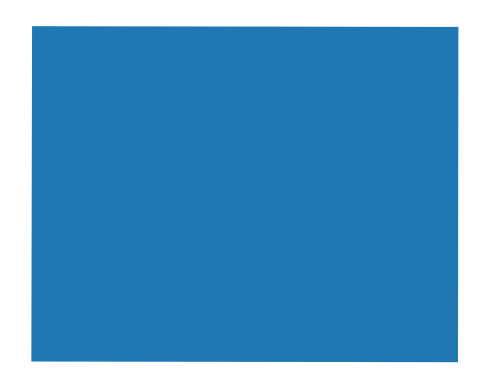

In [ ]:
abidjan_city.plot()
plt.axis('off')



> Division en tuiles plus petites et choisissez une zone 5x5



In [ ]:
abidjan_city = gpd.read_file(os.path.join(DATA_FOLDER, "Geo_Abj.geojson"))
abidjan_city = abidjan_city.to_crs(epsg=abidjan_crs.epsg)

In [ ]:
abidjan_city_shape = abidjan_city.geometry.values[0]

# Utiliser des limites pour déterminer la largeur et la hauteur
# Use bounds to determine width and height
country_width = abidjan_city_shape.bounds[2] - abidjan_city_shape.bounds[0]
country_height = abidjan_city_shape.bounds[3] - abidjan_city_shape.bounds[1]
print(f"Dimension of the area is {country_width:.0f} x {country_height:.0f} m2")

Dimension of the area is 63915 x 50289 m2


(352519.1822483584, 422825.1645968764, 570605.436715998, 625923.2061691848)

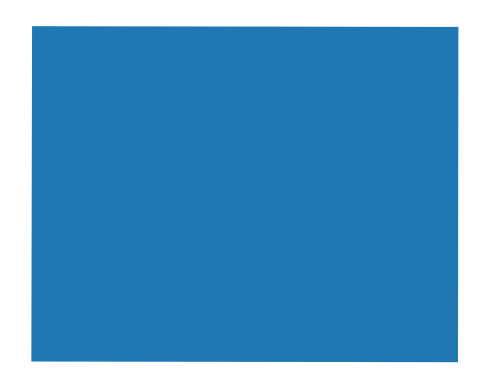

In [ ]:
abidjan_city.plot()
plt.axis('off')

J'utilise UtmZoneSplitter et UtmGridSplitter pour diviser une zone qui s'étend sur plusieurs zones UTM. Je crée ensuite la bbox_list et la bbox_list et après cela, je crée le GeoDataFrame que j'utilise pour le traçage.

In [ ]:
# Créer un séparateur pour obtenir une liste de bbox avec 8km de côté
# Create a splitter to obtain a list of bboxes with 8km sides
bbox_splitter = UtmZoneSplitter([abidjan_city_shape], abidjan_city.crs, 8000)

# un dictionnaire avec les paramètres de région (n, s, e, w, etc.) que nous voulons définir avant d'appliquer la commande
bbox_list = np.array(bbox_splitter.get_bbox_list())
info_list = np.array(bbox_splitter.get_info_list())

# Affichage du nombre de bbox
# Display of the number of bboxes
len(bbox_list)

63

In [ ]:
# Préparer les informations des EO Patches sélectionnés
# Prepare info of selected EOPatches
geometry = [Polygon(bbox.get_polygon()) for bbox in bbox_list]
idxs = [info["index"] for info in info_list]
idxs_x = [info["index_x"] for info in info_list]
idxs_y = [info["index_y"] for info in info_list]

bbox_gdf = gpd.GeoDataFrame({"index": idxs, "index_x": idxs_x, "index_y": idxs_y}, crs=abidjan_city.crs, geometry=geometry)

# select a 5x5 area (id of center patch)
# sélectionnez une zone 5x5 (id du patch central)
ID = 31

# Obtenir les patchs 5x5 environnants
# Obtain surrounding 5x5 patches
patchIDs = []
for idx, (bbox, info) in enumerate(zip(bbox_list, info_list)):
    if abs(info["index_x"] - info_list[ID]["index_x"]) <= 2 and abs(info["index_y"] - info_list[ID]["index_y"]) <= 2:
        patchIDs.append(idx)

# Vérifiez si la taille finale est 5x5
# Check if final size is 5x5
if len(patchIDs) != 5 * 5:
    print("Erreur ! Utilisez un ID de patch central différent, celui-ci est sur la bordure.")

# Changer l'ordre des patchs (utile pour tracer)
# Change the order of the patches (useful for plotting)
patchIDs = np.transpose(np.fliplr(np.array(patchIDs).reshape(5, 5))).ravel()

# Enregistrer dans le fichier shapefile
# Save to shapefile
shapefile_name = "grid_abidjan_500x500.gpkg"
bbox_gdf.to_file(os.path.join(RESULTS_FOLDER, shapefile_name), driver="GPKG")



> Visualiser la sélection



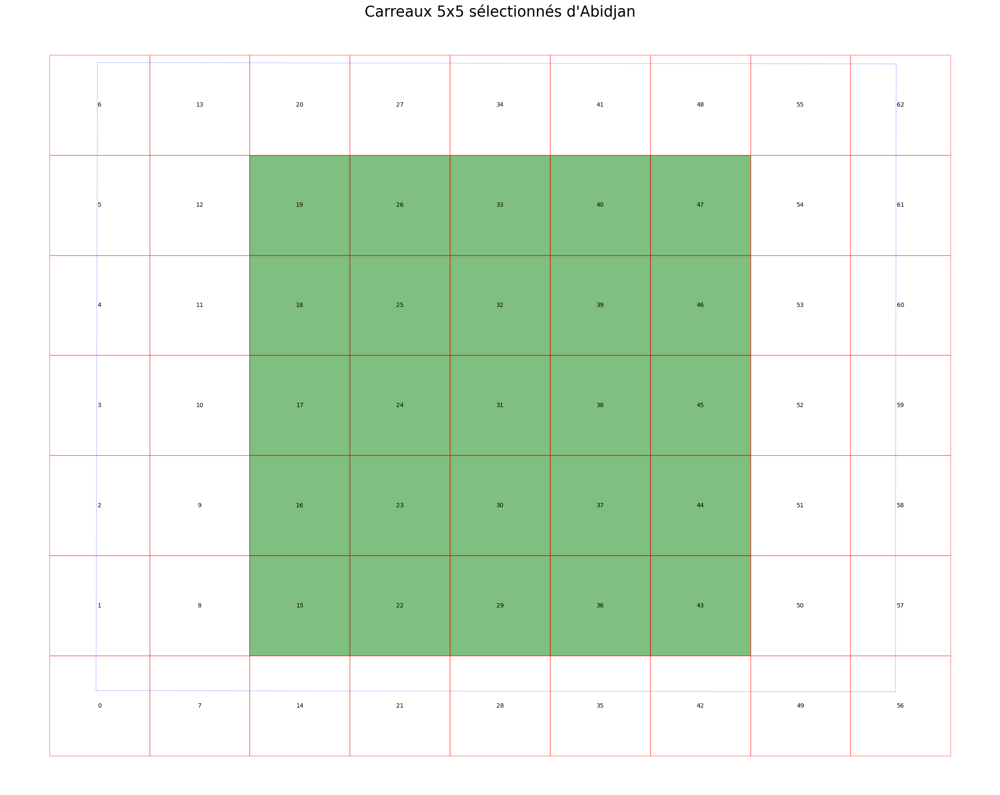

In [ ]:
# Afficher les bboxes sur Abidjan
# Display bboxes over Abidjan
fig, ax = plt.subplots(figsize=(30, 30))
ax.set_title("Carreaux 5x5 sélectionnés d'Abidjan", fontsize=25)
abidjan_city.plot(ax=ax, facecolor="w", edgecolor="b", alpha=0.5)
bbox_gdf.plot(ax=ax, facecolor="w", edgecolor="r", alpha=0.5)

for bbox, info in zip(bbox_list, info_list):
    geo = bbox.geometry
    ax.text(geo.centroid.x, geo.centroid.y, info["index"], ha="center", va="center")

# Marquer les bboxes de la zone sélectionnée
# Mark bboxes of selected area
bbox_gdf[bbox_gdf.index.isin(patchIDs)].plot(ax=ax, facecolor="g", edgecolor="r", alpha=0.5)

plt.axis("off");

In [ ]:
#Enregistrer dans le fichier shapefile
#Save to shapefile
shapefile_name = "grid_abidjan.gpkg"
shp_file_name = "grid_abidjan.shp"


bbox_gdf.to_file(os.path.join(RESULTS_FOLDER, shapefile_name), driver="GPKG")
bbox_gdf.to_file(os.path.join(RESULTS_FOLDER, shapefile_name))

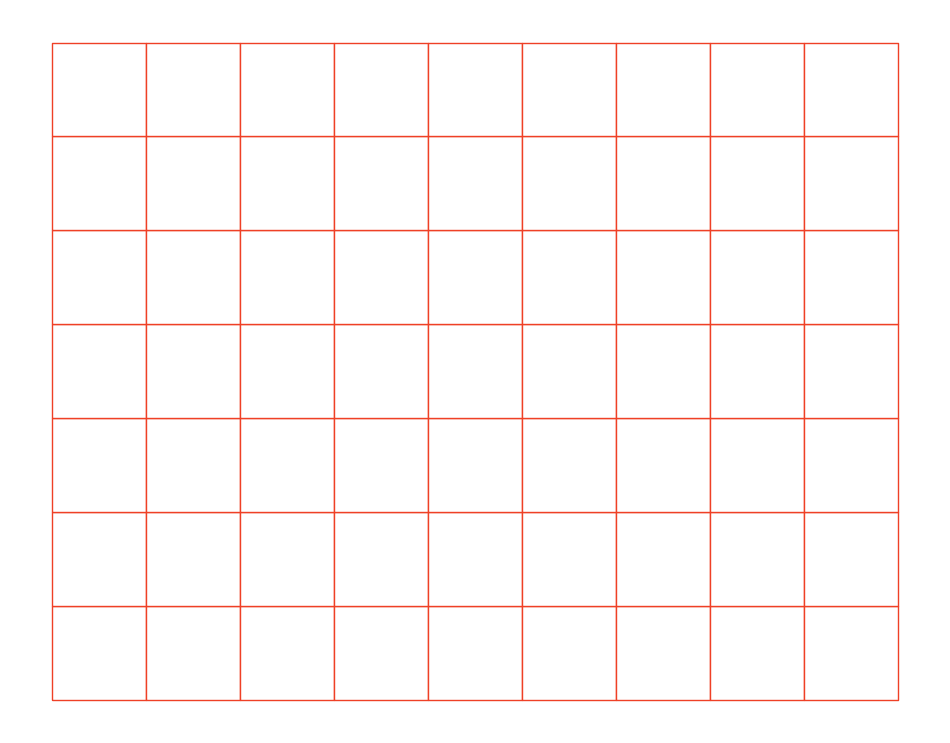

In [ ]:
_, ax = plt.subplots(1,1,figsize=(12,12))
# Tracer les limites de la ville
# Plot city's boundary
abidjan_city.plot(ax=ax, facecolor='white', edgecolor='royalblue')
# Boîtes englobantes des patchs de tracé
# Plot patches' bounding boxes
bbox_gdf.plot(ax=ax, facecolor='white', edgecolor='xkcd:tomato')

plt.axis('off');

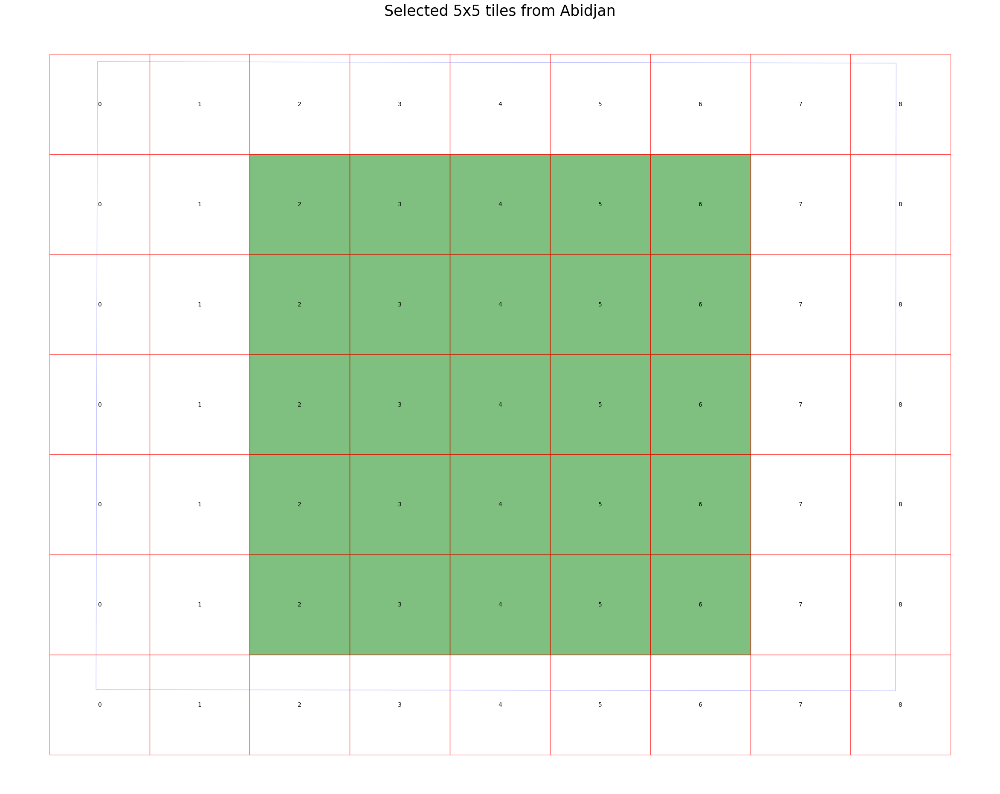

In [ ]:
# Afficher les bboxes sur Abidjan
# Display bboxes over Abidjan
fig, ax = plt.subplots(figsize=(30, 30))
ax.set_title("Selected 5x5 tiles from Abidjan", fontsize=25)
abidjan_city.plot(ax=ax, facecolor="w", edgecolor="b", alpha=0.5)
bbox_gdf.plot(ax=ax, facecolor="w", edgecolor="r", alpha=0.5)

for bbox, info in zip(bbox_list, info_list):
    geo = bbox.geometry
    ax.text(geo.centroid.x, geo.centroid.y, info["index_x"], ha="center", va="center")

# Marquer les bboxes de la zone sélectionnée
# Mark bboxes of selected area
bbox_gdf[bbox_gdf.index.isin(patchIDs)].plot(ax=ax, facecolor="g", edgecolor="r", alpha=0.5)

plt.axis("off");

# Téléchargement des données


---

Il est maintenant temps de créer des EOPatches et de les remplir avec des données Sentinel-2 à l'aide des services Sentinel Hub. Nous ajouterons les données suivantes à chaque EOPatch :

* Liste personnalisée de bandes L1C [B02, B03, B04, B08, B11, B12], qui correspond aux longueurs d'onde [B, G, R, NIR, SWIR1, SWIR2].


* Masque cloud de SentinelHub

De plus, nous ajouterons :

* Informations NDVI, NDWI et NDBI calculées

* Un masque de validité, basé sur les données acquises de Sentinel et la couverture cloud. Le pixel valide est si : IS_DATA == Vrai

* CLOUD_MASK == 0 (1 indique des pixels nuageux et 255 indique NO_DATA)

* Un EOPatch est créé et manipulé à l'aide d'EOTasks, qui sont enchaînées dans un EOWorkflow. Dans cet exemple, le workflow final est exécuté sur tous les correctifs, qui sont enregistrés dans le répertoire spécifié.



---

# Download data



Now is the time to create EOPatches and populate them with Sentinel-2 data using Sentinel Hub Services. We will add the following data to each EOPatch:

* Custom list of L1C bands [B02, B03, B04, B08, B11, B12], which corresponds to wavelengths [B, G, R, NIR, SWIR1, SWIR2].


* Cloud mask from SentinelHub

Additionally, we will add:

* Calculated NDVI, NDWI and NDBI information

* A validity mask, based on data acquired from Sentinel and cloud coverage. Valid pixel is if: IS_DATA == True

* CLOUD_MASK == 0 (1 indicates cloudy pixels and 255 indicates NO_DATA)

* An EOPatch is created and manipulated using EOTasks, which are chained together in an EOWorkflow. In this example, the final workflow is run on all patches, which are saved to the specified directory.

In [ ]:
class SentinelHubValidDataTask(EOTask):
    """
    Combine Sen2Cor's classification map with `IS_DATA` to define a `VALID_DATA_SH` mask
    The SentinelHub's cloud mask is asumed to be found in eopatch.mask['CLM']
    ---------------------------------------------
    Combinez la carte de classification de Sen2Cor avec `IS_DATA` pour définir un masque `VALID_DATA_SH`
     Le masque cloud du SentinelHub est supposé se trouver dans eopatch.mask['CLM']
    """

    def __init__(self, output_feature):
        self.output_feature = output_feature

    def execute(self, eopatch):
        eopatch[self.output_feature] = eopatch.mask["IS_DATA"].astype(bool) & (~eopatch.mask["CLM"].astype(bool))
        return eopatch


class AddValidCountTask(EOTask):
    """
    The task counts number of valid observations in time-series and stores the results in the timeless mask.
    ------------------------------------------------
    La tâche compte le nombre d'observations valides dans des séries chronologiques et stocke les résultats dans le masque intemporel.
    """

    def __init__(self, count_what, feature_name):
        self.what = count_what
        self.name = feature_name

    def execute(self, eopatch):
        eopatch[FeatureType.MASK_TIMELESS, self.name] = np.count_nonzero(eopatch.mask[self.what], axis=0)
        return eopatch

> Définition des tâches du workflow



In [ ]:
band_names = ["B01", "B02", "B03", "B04", "B05", "B06", "B07", "B08", "B8A", "B09", "B11", "B12"]
add_data = SentinelHubInputTask(
    bands_feature=(FeatureType.DATA, "BANDS"),
    bands=band_names,
    resolution=10,
    maxcc=0.08,
    time_difference=datetime.timedelta(minutes=120),
    data_collection=DataCollection.SENTINEL2_L1C,
    additional_data=[(FeatureType.MASK, "dataMask", "IS_DATA"), (FeatureType.MASK, "CLM"), (FeatureType.DATA, "CLP")],
    config=config,
    max_threads=5,
)

# CALCULATING NEW FEATURES
# CALCUL DES NOUVELLES CARACTÉRISTIQUES
# NDVI: (B08 - B04)/(B08 + B04)
# NDWI: (B03 - B08)/(B03 + B08)
# NDBI: (B11 - B08)/(B11 + B08)
ndvi = NormalizedDifferenceIndexTask(
    (FeatureType.DATA, "BANDS"), (FeatureType.DATA, "NDVI"), [band_names.index("B08"), band_names.index("B04")]
)
ndwi = NormalizedDifferenceIndexTask(
    (FeatureType.DATA, "BANDS"), (FeatureType.DATA, "NDWI"), [band_names.index("B03"), band_names.index("B08")]
)
ndbi = NormalizedDifferenceIndexTask(
    (FeatureType.DATA, "BANDS"), (FeatureType.DATA, "NDBI"), [band_names.index("B11"), band_names.index("B08")]
)

# MASQUE DE VALIDITÉ
# Validez les pixels à l'aide du masque de détection de nuage Sentinel Hub et de la région d'acquisition
# VALIDITY MASK
# Validate pixels using SentinelHub's cloud detection mask and region of acquisition
add_sh_validmask = SentinelHubValidDataTask((FeatureType.MASK, "IS_VALID"))

# COMPTAGE DE PIXELS VALIDES
# Compter le nombre d'observations valides par pixel en utilisant un masque de données valide
# COUNTING VALID PIXELS
# Count the number of valid observations per pixel using valid data mask
add_valid_count = AddValidCountTask("IS_VALID", "VALID_COUNT")

# SAUVEGARDE VERS LA SORTIE (si nécessaire)
# SAVING TO OUTPUT (if needed)
save = SaveTask(EOPATCH_FOLDER, overwrite_permission=OverwritePermission.OVERWRITE_PATCH)


Pour cet exemple, un sous-ensemble de la référence nationale pour l'utilisation des terres et l'occupation des sols est fourni. Il est disponible sous la forme d'un géopackage, qui contient des polygones et leurs étiquettes correspondantes. Les étiquettes représentent les 10 classes suivantes :

* lulcid = 0, nom = pas de données
* lulcid = 1, nom = forêt
* lulcide = 2, nom = forêt dégradé
* lulcide = 3, nom = culture
* lulcid = 4, nom = zone artificielle
* lulcide = 5, nom = eau

Nous avons défini ci-dessous une classe d'énumération de couverture du sol pour en faciliter l'utilisation.

---


For this example, a subset of the national baseline for land use and land cover is provided. It is available as a geopackage, which contains polygons and their corresponding labels. The labels represent the following 10 classes:

* lulcid=0, name=no data
* lulcid=1, name=forest
* lulcide = 2, name = degraded forest
*lulcide=3, name=culture
* lulcid=4, name=artificial area
* lulcide = 5, noun = water

We have defined a land cover enumeration class below for ease of use.

In [ ]:
class LULC(MultiValueEnum):
    # Enumération des classes contenant les types LULC de base
    # Enum class containing basic LULC types

    No_Data                   = "No Data",                                  0, "#ffffff"
    Plan_cours_d_eau          = "Plan et cours d'eau",                      1, "#3b46e7"
    Frt_Dnse                  = "Forêt dense",                              2, "#089d1c"
    Forêt_secd                = "Forêt secondaire",                         3, "#75d162"
    Cultures                  = "Cultures",                                 4, "#ede19a"
    Habitats_Infrastructures  = "Habitats humains et Infrastructures",      5, "#ba6c12"

    @property
    def id(self):
        return self.values[1]

    @property
    def color(self):
        return self.values[2]

# Éléments de palette de couleurs de référence
# Reference colormap things
lulc_cmap = ListedColormap([x.color for x in LULC], name="lulc_cmap")
lulc_norm = BoundaryNorm([x - 0.5 for x in range(len(LULC) + 1)], lulc_cmap.N)

In [ ]:
add_sh_validmask = SentinelHubValidDataTask((FeatureType.MASK, "IS_VALID"))
add_valid_count = AddValidCountTask("IS_VALID", "VALID_COUNT")
save = SaveTask(EOPATCH_FOLDER, overwrite_permission=OverwritePermission.OVERWRITE_PATCH)

In [ ]:
# Lire un fichier KML dans un DataFrame GeoPandas
# Read a KML File into a GeoPandas DataFrame
gpd.io.file.fiona.drvsupport.supported_drivers

{'DXF': 'rw',
 'CSV': 'raw',
 'OpenFileGDB': 'raw',
 'ESRIJSON': 'r',
 'ESRI Shapefile': 'raw',
 'FlatGeobuf': 'raw',
 'GeoJSON': 'raw',
 'GeoJSONSeq': 'raw',
 'GPKG': 'raw',
 'GML': 'rw',
 'OGR_GMT': 'rw',
 'GPX': 'rw',
 'MapInfo File': 'raw',
 'DGN': 'raw',
 'S57': 'r',
 'SQLite': 'raw',
 'TopoJSON': 'r'}

In [ ]:
# Loading the post classification geopackage file
# Chargement du fichier geopackage post classification
output = os.path.join(DATA_FOLDER, "Classification Abidjan 2022_M4.gpkg")
data = gpd.read_file(output)
data

,DN,geometry
0,3,"MULTIPOLYGON (((-4.30183 5.63854, -4.30183 5.6..."
1,2,"MULTIPOLYGON (((-4.30160 5.63854, -4.30160 5.6..."
2,3,"MULTIPOLYGON (((-4.29976 5.63854, -4.29976 5.6..."
3,3,"MULTIPOLYGON (((-4.29838 5.63854, -4.29838 5.6..."
4,3,"MULTIPOLYGON (((-4.29492 5.63854, -4.29492 5.6..."
...,...,...
350313,5,"MULTIPOLYGON (((-3.72804 5.19221, -3.72804 5.1..."
350314,5,"MULTIPOLYGON (((-3.72758 5.19221, -3.72758 5.1..."
350315,5,"MULTIPOLYGON (((-3.72735 5.19221, -3.72735 5.1..."
350316,1,"MULTIPOLYGON (((-3.72943 5.19198, -3.72943 5.1..."


In [ ]:
outpu_files = os.path.join(DATA_FOLDER, "Classification_Abidjan_2022_plk.gpkg")
data.to_file(outpu_files, driver="GPKG")

In [ ]:
utpu_files = os.path.join(DATA_FOLDER, "Classification_Abidjan_2022_plk.gpkg")

Le point principal de cette tâche est de créer un masque raster à partir des polygones vectoriels et de l'ajouter à l'eopatch. Avec cette procédure, tout type de fichier de formes étiqueté peut être transformé en une carte de référence raster. Ce résultat est obtenu avec la tâche existante VectorToRaster du package eolearn.geometry. Tous les polygones appartenant à chacune des classes sont gravés séparément dans le masque raster.

Les données d'utilisation des terres sont publiques en Slovénie, vous pouvez utiliser l'ensemble de données partiel fourni pour cet exemple, ou télécharger l'ensemble de données complet (si vous souhaitez mettre à l'échelle le projet) à partir de notre bucket. Les ensembles de données ont déjà été prétraités pour les besoins de l'exemple.


---
The main point of this task is to create a raster mask from the vector polygons and add it to the eopatch. With this procedure, any kind of a labeled shapefile can be transformed into a raster reference map. This result is achieved with the existing task VectorToRaster from the eolearn.geometry package. All polygons belonging to the each of the classes are separately burned to the raster mask.

Land use data are public in Slovenia, you can use the provided partial dataset for this example, or download the full dataset (if you want to upscale the project) from our bucket. The datasets have already been pre-processed for the purposes of the example.


In [ ]:
vector_feature = FeatureType.VECTOR_TIMELESS, "LULC_REFERENCE"

vector_import_task = VectorImportTask(vector_feature, outpu_files)

rasterization_task = VectorToRasterTask(
    vector_feature,
    (FeatureType.MASK_TIMELESS, "LULC"),
    values_column="DN",
    raster_shape=(FeatureType.MASK, "IS_DATA"),
    raster_dtype=np.uint8,
)

Définir le flux de travail

Toutes les tâches qui ont été définies jusqu'à présent créent et remplissent les EOPatches. Les tâches doivent être mises dans un certain ordre et exécutées une par une. Ceci peut être réalisé en exécutant manuellement les tâches, ou plus commodément, en définissant un EOWorkflow qui le fait pour vous.

Le workflow suivant est créé et exécuté :

Créez des EOPatches avec des données de bande et de cloud

1. Calculer et additionner NDVI, NDWI, NORM
2. Ajouter un masque de pixels valides
3. Ajouter une fonctionnalité scalaire représentant le nombre de pixels valides
4. Enregistrer les éopatchs

Un EOWorkflow peut être linéaire ou plus complexe, mais il doit être acyclique. Ici, nous utiliserons le cas linéaire de l'EOWorkflow, disponible en tant que LinearWorkflow

Définir le flux de travail

---


Define the workflow

All the tasks that were defined so far create and fill the EOPatches. The tasks need to be put in some order and executed one by one. This can be achieved by manually executing the tasks, or more conveniently, defining an EOWorkflow which does this for you.

The following workflow is created and executed:

Create EOPatches with band and cloud data

1. Calculate and add NDVI, NDWI, NORM
2. Add mask of valid pixels
3. Add scalar feature representing the count of valid pixels
4. Save eopatches

An EOWorkflow can be linear or more complex, but it should be acyclic. Here we will use the linear case of the EOWorkflow, available as LinearWorkflow

Define the workflow

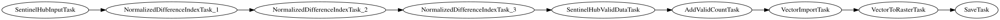

In [ ]:
# Définition du workflow
# Define the workflow
workflow_nodes = linearly_connect_tasks(
    add_data, ndvi, ndwi, ndbi, add_sh_validmask, add_valid_count, vector_import_task, rasterization_task, save
)
workflow = EOWorkflow(workflow_nodes)
# Visualliser le workflow
# visualize workflow
workflow.dependency_graph()

In [ ]:
%%time

# Intervalle de temps pour la requête SH
# Time interval for the SH request
time_interval = ["2016-01-01", "2022-12-30"]
# time_interval = ["2019-01-01", "2019-06-30"]

# Définir des paramètres supplémentaires du workflow
# Define additional parameters of the workflow
input_node = workflow_nodes[0]
save_node = workflow_nodes[-1]
execution_args = []
for idx, bbox in enumerate(bbox_list[patchIDs]):
    execution_args.append(
        {
            input_node: {"bbox": bbox, "time_interval": time_interval},
            save_node: {"eopatch_folder": f"eopatch_{idx}"},
        }
    )

CPU times: user 104 µs, sys: 3 µs, total: 107 µs
Wall time: 111 µs


In [ ]:
# Exécution du workflow, puis téléchargement des données
# Running the workflow, then downloading the data
executor = EOExecutor(workflow, execution_args, save_logs=True)
executor.run(workers=1)

executor.make_report()

# En cas d'erreur d'exécution du workflow
# In case of workflow execution error
failed_ids = executor.get_failed_executions()
if failed_ids:
    raise RuntimeError(
        f"Execution failed EOPatches with IDs:\n{failed_ids}\n"
        f"For more info check report at {executor.get_report_path()}"
    )

  0%|          | 0/25 [00:00<?, ?it/s]

Le flux de sortie a été tronqué et ne contient que les 5000 dernières lignes.
DEBUG:fiona.ogrext:Next index: 4423
DEBUG:fiona.ogrext:Next index: 4424
DEBUG:fiona.ogrext:Next index: 4425
DEBUG:fiona.ogrext:Next index: 4426
DEBUG:fiona.ogrext:Next index: 4427
DEBUG:fiona.ogrext:Next index: 4428
DEBUG:fiona.ogrext:Next index: 4429
DEBUG:fiona.ogrext:Next index: 4430
DEBUG:fiona.ogrext:Next index: 4431
DEBUG:fiona.ogrext:Next index: 4432
DEBUG:fiona.ogrext:Next index: 4433
DEBUG:fiona.ogrext:Next index: 4434
DEBUG:fiona.ogrext:Next index: 4435
DEBUG:fiona.ogrext:Next index: 4436
DEBUG:fiona.ogrext:Next index: 4437
DEBUG:fiona.ogrext:Next index: 4438
DEBUG:fiona.ogrext:Next index: 4439
DEBUG:fiona.ogrext:Next index: 4440
DEBUG:fiona.ogrext:Next index: 4441
DEBUG:fiona.ogrext:Next index: 4442
DEBUG:fiona.ogrext:Next index: 4443
DEBUG:fiona.ogrext:Next index: 4444
DEBUG:fiona.ogrext:Next index: 4445
DEBUG:fiona.ogrext:Next index: 4446
DEBUG:fiona.ogrext:Next index: 4447
DEBUG:fiona.ogrext:Nex

# Visualisation des eopatch

In [ ]:
EOPatch.load('./eopatches/eopatch_2')

EOPatch(
  data={
    BANDS: numpy.ndarray(shape=(19, 800, 800, 12), dtype=float32)
    CLP: numpy.ndarray(shape=(19, 800, 800, 1), dtype=uint8)
    NDBI: numpy.ndarray(shape=(19, 800, 800, 1), dtype=float32)
    NDVI: numpy.ndarray(shape=(19, 800, 800, 1), dtype=float32)
    NDWI: numpy.ndarray(shape=(19, 800, 800, 1), dtype=float32)
  }
  mask={
    CLM: numpy.ndarray(shape=(19, 800, 800, 1), dtype=uint8)
    IS_DATA: numpy.ndarray(shape=(19, 800, 800, 1), dtype=bool)
    IS_VALID: numpy.ndarray(shape=(19, 800, 800, 1), dtype=bool)
  }
  mask_timeless={
    LULC: numpy.ndarray(shape=(800, 800, 1), dtype=uint8)
    VALID_COUNT: numpy.ndarray(shape=(800, 800, 1), dtype=int64)
  }
  vector_timeless={
    LULC_REFERENCE: geopandas.GeoDataFrame(columns=['DN', 'geometry'], length=7659, crs=EPSG:32630)
  }
  bbox=BBox(((384000.0, 608000.0), (392000.0, 616000.0)), crs=CRS('32630'))
  timestamps=[datetime.datetime(2016, 1, 6, 10, 50, 13), ..., datetime.datetime(2022, 12, 25, 10, 49, 33)], len

In [ ]:
eopatch = EOPatch.load('./eopatches/eopatch_0')

In [ ]:
eopatch.timestamp

/usr/local/lib/python3.10/dist-packages/eolearn/core/eodata.py:325: EODeprecationWarning: The attribute `timestamp` is deprecated, use `timestamps` instead.
  value = super().__getattribute__(key)


[datetime.datetime(2016, 1, 6, 10, 50, 13),
 datetime.datetime(2016, 2, 5, 10, 46, 27),
 datetime.datetime(2017, 12, 11, 10, 38, 20),
 datetime.datetime(2018, 1, 5, 10, 41, 28),
 datetime.datetime(2018, 2, 9, 10, 38, 43),
 datetime.datetime(2018, 3, 6, 10, 44, 19),
 datetime.datetime(2018, 12, 26, 10, 49, 30),
 datetime.datetime(2019, 1, 10, 10, 49, 29),
 datetime.datetime(2019, 1, 20, 10, 49, 30),
 datetime.datetime(2019, 2, 14, 10, 49, 34),
 datetime.datetime(2019, 3, 26, 10, 53, 42),
 datetime.datetime(2019, 12, 26, 10, 49, 28),
 datetime.datetime(2020, 1, 5, 10, 49, 28),
 datetime.datetime(2020, 1, 30, 10, 49, 26),
 datetime.datetime(2020, 2, 4, 10, 49, 26),
 datetime.datetime(2021, 12, 30, 10, 49, 30),
 datetime.datetime(2022, 1, 24, 10, 49, 34),
 datetime.datetime(2022, 4, 29, 10, 49, 27),
 datetime.datetime(2022, 12, 25, 10, 49, 33)]

In [ ]:
"""
  En raison du filtrage maxcc, tous les correctifs n'ont pas le même nombre d'horodatages.
  Choisissons une date et dessinons l'horodatage le plus proche pour chaque éopatch.
  ----------------------------------------------------
  Due to the maxcc filtering, not all patches have the same amount of timestamps.
  Let's select a date and draw the closest timestamp for each eopatch.
"""
# Dessinez les images RGB
# Draw the RGB images
fig, axs = plt.subplots(nrows=5, ncols=5, figsize=(20, 20))
date = datetime.datetime(2022, 12, 25)

for i in tqdm(range(len(patchIDs))):
    eopatch_path = os.path.join(EOPATCH_FOLDER, f"eopatch_{i}")
    eopatch = EOPatch.load(eopatch_path, lazy_loading=True)

    dates = np.array([timestamp.replace(tzinfo=None) for timestamp in eopatch.timestamp])
    closest_date_id = np.argsort(abs(date - dates))[0]

    ax = axs[i // 5][i % 5]
    ax.imshow(np.clip(eopatch.data["BANDS"][closest_date_id][..., [2, 1, 0]] * 3.5, 0, 1))
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_aspect("auto")
    del eopatch

fig.subplots_adjust(wspace=0, hspace=0)

In [ ]:
# Dessinez les images avec la coloration 8-11-4 pour mieux identifier les classes
#  Draw the RGB images
fig, axs = plt.subplots(nrows=5, ncols=5, figsize=(20, 20))

date = datetime.datetime(2022, 12, 25)

for i in tqdm(range(len(patchIDs))):
    eopatch_path = os.path.join(EOPATCH_FOLDER, f"eopatch_{i}")
    eopatch = EOPatch.load(eopatch_path, lazy_loading=True)

    dates = np.array([timestamp.replace(tzinfo=None) for timestamp in eopatch.timestamp])
    closest_date_id = np.argsort(abs(date - dates))[0]

    ax = axs[i // 5][i % 5]
    ax.imshow(np.clip(eopatch.data["BANDS"][closest_date_id][..., [7, 3, 4]] * 3.5, 0, 1))
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_aspect("auto")
    del eopatch

fig.subplots_adjust(wspace=0, hspace=0)


> **Visualiser la carte de référence**



  0%|          | 0/25 [00:00<?, ?it/s]

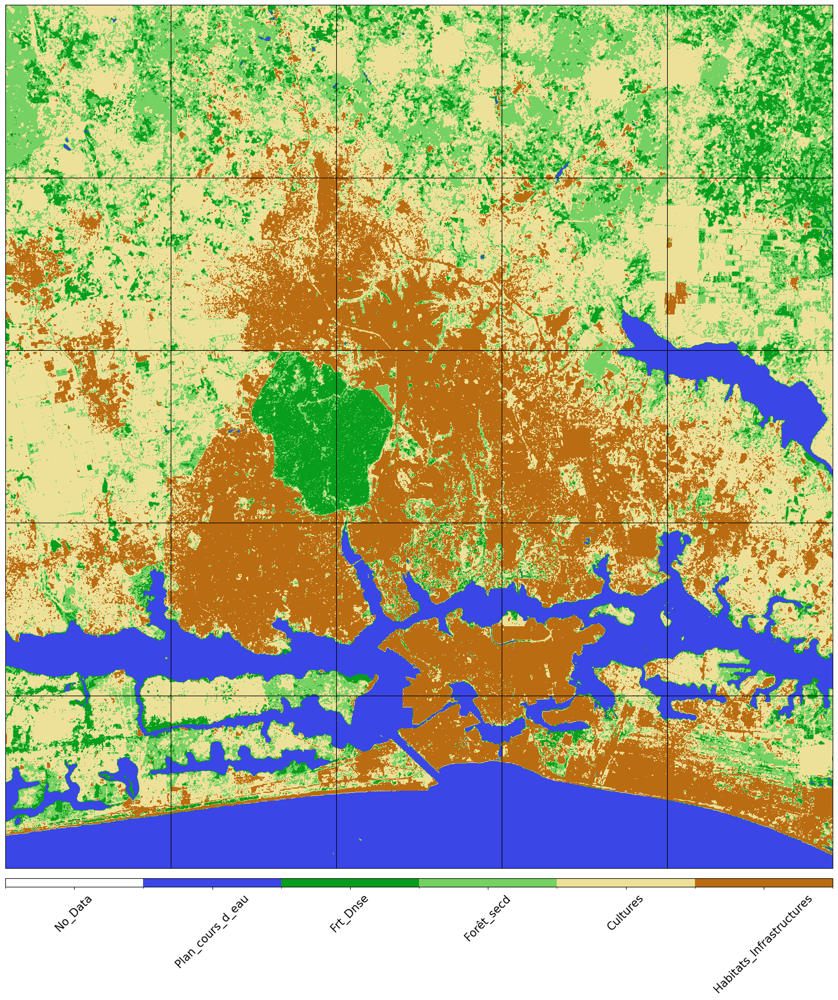

In [ ]:
fig, axs = plt.subplots(nrows=5, ncols=5, figsize=(20, 25))

for i in tqdm(range(len(patchIDs))):
    eopatch_path = os.path.join(EOPATCH_FOLDER, f"eopatch_{i}")
    eopatch = EOPatch.load(eopatch_path, lazy_loading=True)

    ax = axs[i // 5][i % 5]
    im = ax.imshow(eopatch.mask_timeless["LULC"].squeeze(), cmap=lulc_cmap, norm=lulc_norm)
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_aspect("auto")
    del eopatch

fig.subplots_adjust(wspace=0, hspace=0)

cb = fig.colorbar(im, ax=axs.ravel().tolist(), orientation="horizontal", pad=0.01, aspect=100)
cb.ax.tick_params(labelsize=20)
cb.set_ticks([entry.id for entry in LULC])
cb.ax.set_xticklabels([entry.name for entry in LULC], rotation=45, fontsize=15)
plt.show();

NameError: ignored

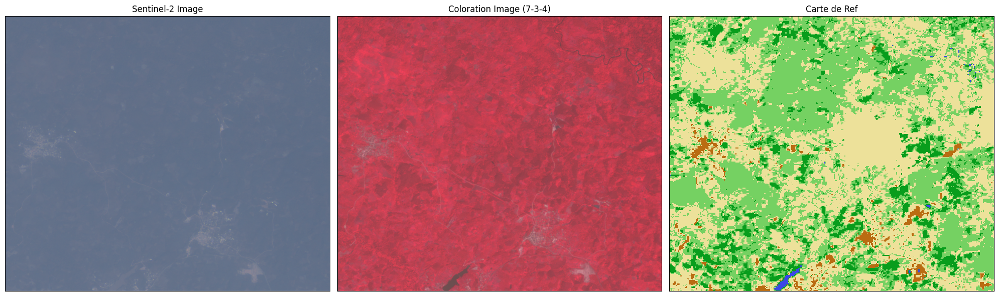

In [ ]:
import random

# Sélectionner un EOPatch aléatoire
random_patch_id = random.randint(0, 24)
eopatch_path = os.path.join(EOPATCH_FOLDER, f"eopatch_{random_patch_id}")
eopatch = EOPatch.load(eopatch_path, lazy_loading=True)

# Créer la figure et les axes
fig, axs = plt.subplots(nrows=1, ncols=3, figsize=(20, 6))

# Afficher l'image Sentinel-2 à gauche
axs[0].imshow(eopatch.data["BANDS"][0][..., [2, 1, 0]] * 3.5)
axs[0].set_title("Sentinel-2 Image")
axs[0].set_xticks([])
axs[0].set_yticks([])
axs[0].set_aspect("auto")

# Calculer la coloration de l'image 8-11-4
color_image = eopatch.data["BANDS"][0][..., [7, 3, 4]]
color_image = color_image / np.max(color_image)

# Afficher la coloration de l'image 8-11-4 au centre
axs[1].imshow(color_image)
axs[1].set_title("Coloration Image (7-3-4)")
axs[1].set_xticks([])
axs[1].set_yticks([])
axs[1].set_aspect("auto")

# Afficher la carte de référence à droite
axs[2].imshow(eopatch.mask_timeless["LULC"].squeeze(), cmap=lulc_cmap, norm=lulc_norm)
axs[2].set_title("Carte de Ref")
axs[2].set_xticks([])
axs[2].set_yticks([])
axs[2].set_aspect("auto")

plt.tight_layout()
plt.show()


Tracer la carte des nombres de pixels valides

  0%|          | 0/25 [00:00<?, ?it/s]

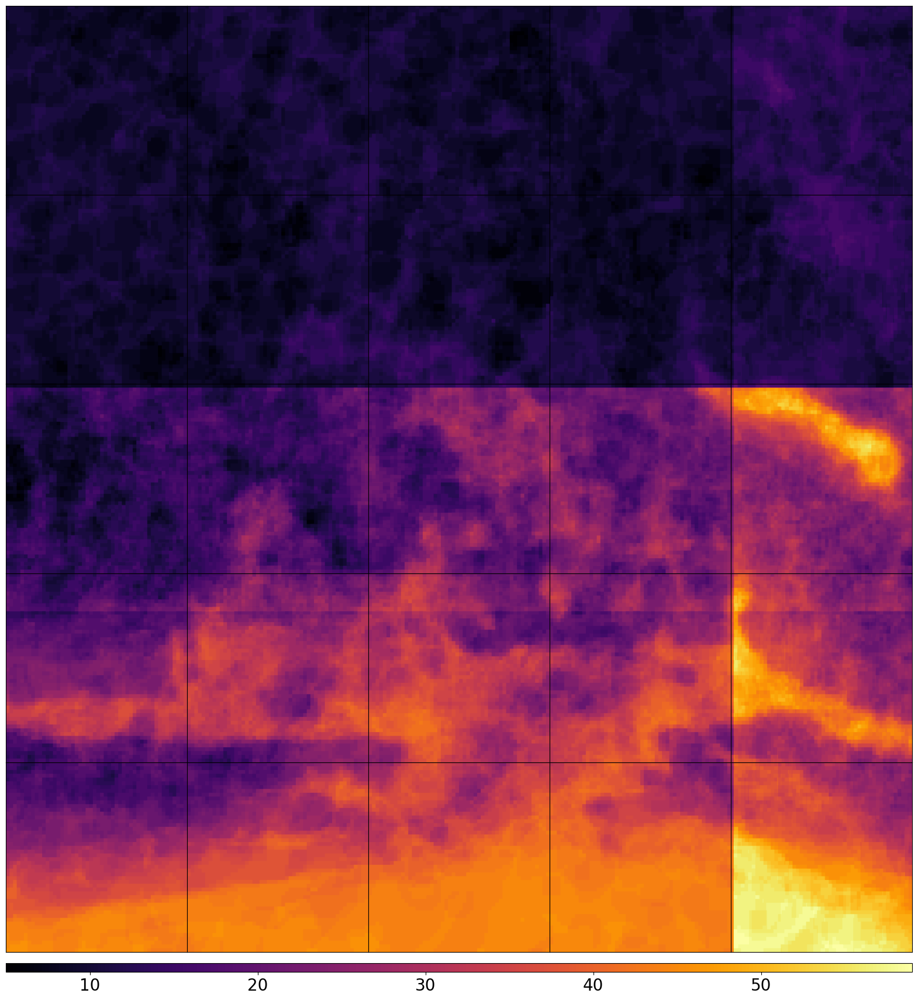

In [ ]:
# Calculer le nombre minimum et maximum de données valides par pixel
# Calculate min and max counts of valid data per pixel
vmin, vmax = None, None
for i in range(len(patchIDs)):
    eopatch_path = os.path.join(EOPATCH_FOLDER, f"eopatch_{i}")
    eopatch = EOPatch.load(eopatch_path, lazy_loading=True)
    data = eopatch.mask_timeless["VALID_COUNT"].squeeze()
    vmin = np.min(data) if vmin is None else (np.min(data) if np.min(data) < vmin else vmin)
    vmax = np.max(data) if vmax is None else (np.max(data) if np.max(data) > vmax else vmax)

fig, axs = plt.subplots(nrows=5, ncols=5, figsize=(20, 25))

for i in tqdm(range(len(patchIDs))):
    eopatch_path = os.path.join(EOPATCH_FOLDER, f"eopatch_{i}")
    eopatch = EOPatch.load(eopatch_path, lazy_loading=True)
    ax = axs[i // 5][i % 5]
    im = ax.imshow(eopatch.mask_timeless["VALID_COUNT"].squeeze(), vmin=vmin, vmax=vmax, cmap=plt.cm.inferno)
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_aspect("auto")
    del eopatch

fig.subplots_adjust(wspace=0, hspace=0)

cb = fig.colorbar(im, ax=axs.ravel().tolist(), orientation="horizontal", pad=0.01, aspect=100)
cb.ax.tick_params(labelsize=20)
plt.show()



> Moyenne spatiale du NDVI


---


> NDVI spatial average



<ipython-input-49-68ebe7147e83>:6: EODeprecationWarning: The attribute `timestamp` is deprecated, use `timestamps` instead.
  time = np.array(eopatch.timestamp)


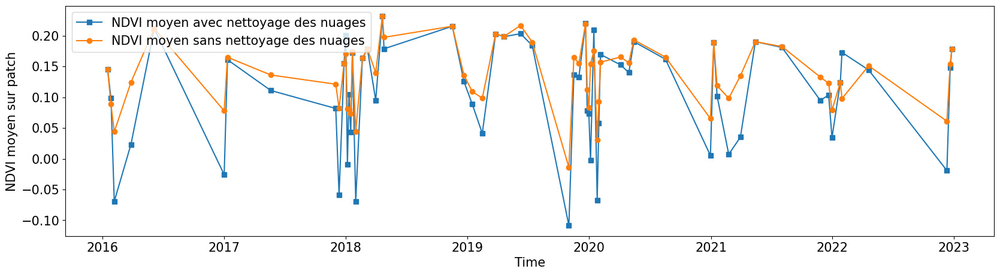

In [ ]:
eID = 16
eopatch = EOPatch.load(os.path.join(EOPATCH_FOLDER, f"eopatch_{i}"), lazy_loading=True)

ndvi = eopatch.data["NDVI"]
mask = eopatch.mask["IS_VALID"]
time = np.array(eopatch.timestamp)
t, w, h, _ = ndvi.shape

ndvi_clean = ndvi.copy()
ndvi_clean[~mask] = np.nan  # Set values of invalid pixels to NaN's

# Calculate means, remove NaN's from means
ndvi_mean = np.nanmean(ndvi.reshape(t, w * h), axis=1)
ndvi_mean_clean = np.nanmean(ndvi_clean.reshape(t, w * h), axis=1)
time_clean = time[~np.isnan(ndvi_mean_clean)]
ndvi_mean_clean = ndvi_mean_clean[~np.isnan(ndvi_mean_clean)]

fig = plt.figure(figsize=(20, 5))
plt.plot(time_clean, ndvi_mean_clean, "s-", label="NDVI moyen avec nettoyage des nuages")
plt.plot(time, ndvi_mean, "o-", label="NDVI moyen sans nettoyage des nuages")
plt.xlabel("Time", fontsize=15)
plt.ylabel("NDVI moyen sur patch", fontsize=15)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)

plt.legend(loc=2, prop={"size": 15});

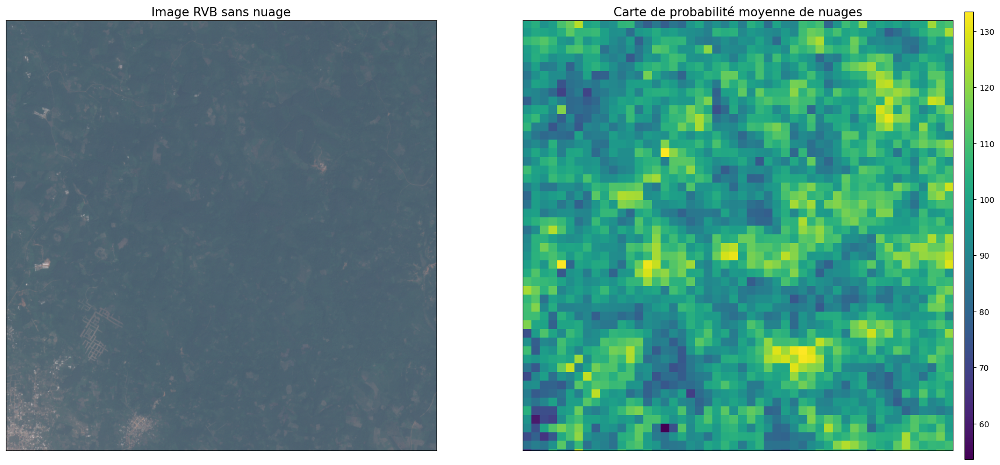

In [ ]:
# Load some patch
eopatch_2 = EOPatch.load(os.path.join(EOPATCH_FOLDER, 'eopatch_2'), lazy_loading=True)

clp = eopatch_2.data['CLP'][...,0]
is_data = eopatch_2.mask['IS_DATA'][...,0]

# Temporal mean
clp = np.where(is_data, clp, np.nan)
clp = np.nanmean(clp, axis=0)

# Plot
fig, (ax1, ax2) = plt.subplots(1,2,figsize=(25,10))

_ = ax1.imshow(np.clip(eopatch_2.data['BANDS'][0][..., [3,2,1]] * 3.5, 0., 1.))
clp_map = ax2.imshow(clp, cmap=plt.cm.viridis)

ax1.set_xticks([])
ax1.set_yticks([])
ax2.set_xticks([])
ax2.set_yticks([])
ax1.set_title('Image RVB sans nuage', fontsize=15)
ax2.set_title('Carte de probabilité moyenne de nuages', fontsize=15)

cb = fig.colorbar(clp_map, ax=[ax1, ax2], orientation='vertical', pad=0.01, aspect=50)

In [ ]:
"""
  Moyenne spatiale du NDVI
  Tracez la moyenne du NDVI sur tous les pixels d'un patch sélectionné tout au long de l'année. Filtrez les nuages dans le calcul de la moyenne.
--------------------------------
  Spatial mean of NDVI
  Plot the mean of NDVI over all pixels in a selected patch throughout the year. Filter out clouds in the mean calculation.
"""
fig, axs = plt.subplots(nrows=5, ncols=5, figsize=(20, 25))

for i in tqdm(range(len(patchIDs))):
    eopatch_path = os.path.join(EOPATCH_FOLDER, f"eopatch_{i}")
    eopatch = EOPatch.load(eopatch_path, lazy_loading=True)
    ndvi = eopatch.data["NDVI"]
    mask = eopatch.mask["IS_VALID"]
    ndvi[~mask] = np.nan
    ndvi_mean = np.nanmean(ndvi, axis=0).squeeze()

    ax = axs[i // 5][i % 5]
    im = ax.imshow(ndvi_mean, vmin=0, vmax=0.8, cmap=plt.get_cmap("YlGn"))
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_aspect("auto")
    del eopatch

fig.subplots_adjust(wspace=0, hspace=0)

cb = fig.colorbar(im, ax=axs.ravel().tolist(), orientation="horizontal", pad=0.01, aspect=100)
cb.ax.tick_params(labelsize=20)
plt.show()

In [ ]:
# Créer une figure avec une grille de sous-graphiques
fig, axs = plt.subplots(nrows=5, ncols=5, figsize=(20, 25))

# Itérer sur les identifiants de patchs
for i in tqdm(range(len(patchIDs))):
    # Charger le EOPatch
    eopatch_path = os.path.join(EOPATCH_FOLDER, f"eopatch_{i}")
    eopatch = EOPatch.load(eopatch_path, lazy_loading=True)

    # Extraire les données NDWI
    ndwi = eopatch.data["NDWI"]

    # Appliquer un masque de validité pour filtrer les pixels invalides (par exemple, les nuages)
    mask = eopatch.mask["IS_VALID"]
    ndwi[~mask] = np.nan

    # Calculer la moyenne spatiale du NDWI
    ndwi_mean = np.nanmean(ndwi, axis=0).squeeze()

    # Sélectionner le sous-graphique pour le patch actuel
    ax = axs[i // 5][i % 5]

    # Tracer la moyenne du NDWI sur le sous-graphique
    im = ax.imshow(ndwi_mean, vmin=-1, vmax=1, cmap=plt.get_cmap("RdYlBu"))

    # Configurer les axes du sous-graphique
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_aspect("auto")

    # Supprimer l'objet EOPatch pour libérer la mémoire
    del eopatch

# Ajuster l'espacement entre les sous-graphiques
fig.subplots_adjust(wspace=0, hspace=0)

# Ajouter une légende à la figure
cb = fig.colorbar(im, ax=axs.ravel().tolist(), orientation="horizontal", pad=0.01, aspect=100)
cb.ax.tick_params(labelsize=20)
cb.set_label("NDWI", fontsize=20)  # Légende de l'indice NDWI

# Afficher la figure
plt.show()


In [ ]:
# Créer une figure avec une grille de sous-graphiques
fig, axs = plt.subplots(nrows=5, ncols=5, figsize=(20, 25))

# Itérer sur les identifiants de patchs
for i in tqdm(range(len(patchIDs))):
    # Charger le EOPatch
    eopatch_path = os.path.join(EOPATCH_FOLDER, f"eopatch_{i}")
    eopatch = EOPatch.load(eopatch_path, lazy_loading=True)

    # Extraire les données NDBI
    ndbi = eopatch.data["NDBI"]

    # Appliquer un masque de validité pour filtrer les pixels invalides (par exemple, les nuages)
    mask = eopatch.mask["IS_VALID"]
    ndbi[~mask] = np.nan

    # Calculer la moyenne spatiale du NDBI
    ndbi_mean = np.nanmean(ndbi, axis=0).squeeze()

    # Sélectionner le sous-graphique pour le patch actuel
    ax = axs[i // 5][i % 5]

    # Tracer la moyenne du NDBI sur le sous-graphique
    im = ax.imshow(ndbi_mean, vmin=-1, vmax=1, cmap=plt.get_cmap("RdYlBu"))

    # Configurer les axes du sous-graphique
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_aspect("auto")

    # Supprimer l'objet EOPatch pour libérer la mémoire
    del eopatch

# Ajuster l'espacement entre les sous-graphiques
fig.subplots_adjust(wspace=0, hspace=0)

# Ajouter une légende à la figure
cb = fig.colorbar(im, ax=axs.ravel().tolist(), orientation="horizontal", pad=0.01, aspect=100)
cb.ax.tick_params(labelsize=20)
cb.set_label("NDBI", fontsize=20)  # Légende de l'indice NDBI

# Afficher la figure
plt.show()


  0%|          | 0/25 [00:00<?, ?it/s]

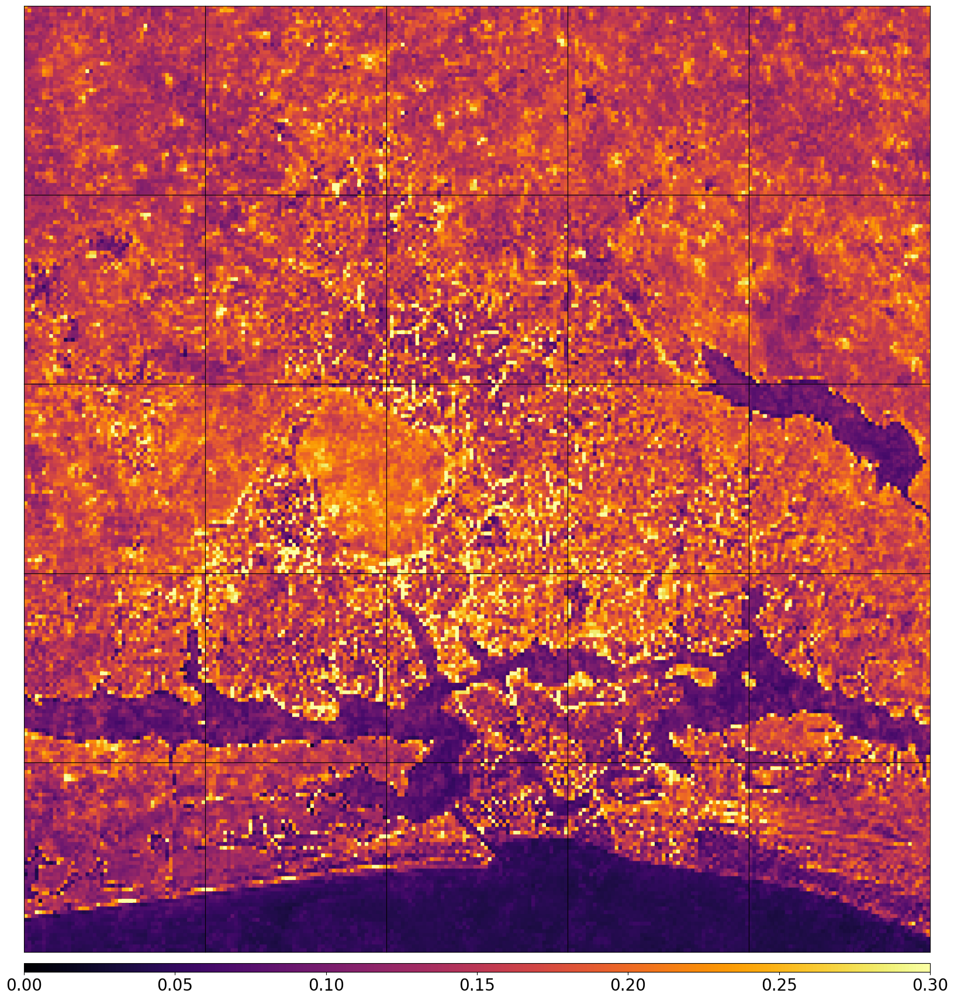

In [ ]:
"""
    Tracer la probabilité moyenne de nuages
    Tracez la moyenne de la probabilité de nuage pour chaque pixel, tenez compte du masque de nuage.
    Certaines structures peuvent être vues comme des réseaux routiers, etc., indiquant un biais du détecteur de nuages vers ces objets.
    ----------------------------
    Plot the average cloud probability
    Plot te average of the cloud probability for each pixel, take the cloud mask into account.
    Some structures can be seen like road networks etc., indicating a bias of the cloud detector towards these objects.
"""
fig, axs = plt.subplots(nrows=5, ncols=5, figsize=(20, 25))

for i in tqdm(range(len(patchIDs))):
    eopatch_path = os.path.join(EOPATCH_FOLDER, f"eopatch_{i}")
    eopatch = EOPatch.load(eopatch_path, lazy_loading=True)
    clp = eopatch.data["CLP"].astype(float) / 255
    mask = eopatch.mask["IS_VALID"]
    clp[~mask] = np.nan
    clp_mean = np.nanmean(clp, axis=0).squeeze()

    ax = axs[i // 5][i % 5]
    im = ax.imshow(clp_mean, vmin=0.0, vmax=0.3, cmap=plt.cm.inferno)
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_aspect("auto")
    del eopatch

fig.subplots_adjust(wspace=0, hspace=0)

cb = fig.colorbar(im, ax=axs.ravel().tolist(), orientation="horizontal", pad=0.01, aspect=100)
cb.ax.tick_params(labelsize=20)
plt.show()

In [ ]:
import random

# Sélectionner un EOPatch au hasard
random_eopatch = random.choice(patchIDs)

# Charger l'EOPatch sélectionné
eopatch_path = os.path.join(EOPATCH_FOLDER, f"eopatch_{random_eopatch}")
eopatch = EOPatch.load(eopatch_path, lazy_loading=True)

# Extraire les données nécessaires
rgb_image = eopatch.data["BANDS"].astype(float) / 255
clp = eopatch.data["CLP"].astype(float) / 255
mask = eopatch.mask["IS_VALID"]

# Calculer la probabilité moyenne de nuages
clp[~mask] = np.nan
clp_mean = np.nanmean(clp, axis=0).squeeze()

# Afficher l'image RGB et la probabilité moyenne de nuages
fig, axs = plt.subplots(1, 2, figsize=(15, 6))

# Afficher l'image RGB à gauche
axs[0].imshow(rgb_image)
axs[0].set_title("Image RGB")
axs[0].axis("off")

# Afficher la probabilité moyenne de nuages à droite
im = axs[1].imshow(clp_mean, vmin=0.0, vmax=0.3, cmap=plt.cm.inferno)
axs[1].set_title("Probabilité moyenne de nuages")
axs[1].axis("off")

# Ajouter une barre de couleur
cb = fig.colorbar(im, ax=axs.ravel().tolist(), orientation="horizontal", pad=0.01, aspect=100)
cb.ax.tick_params(labelsize=10)

plt.tight_layout()
plt.show()

In [ ]:
# Load some patch
eopatch_2 = EOPatch.load(os.path.join(EOPATCH_FOLDER, 'eopatch_2'), lazy_loading=True)

titles = ['B01', 'B02', 'B03', 'B04', 'B05', 'B06', 'B07', 'B08', 'B8A', 'B09', 'B10', 'B11', 'B12', 'NDVI', 'NDWI', 'NORM']

# Plot
fig, axes = plt.subplots(4,4,figsize=(18,18))

def pretty_plot(ax, data, vmin, vmax, title):
    """
    If there are issues with colour-blindness, change the colour map to something else:
    https://matplotlib.org/tutorials/colors/colormaps.html
    """

    ax.imshow(data, vmin=vmin, vmax=vmax, cmap=plt.cm.cividis)
    ax.set_title(title)
    ax.set_xticks([])
    ax.set_yticks([])

# Plot bands
for i in range(12):
    data = eopatch_2.data['BANDS'][0,...,i]
    pretty_plot(axes.flat[i], data, np.min(data), np.max(data), titles[i])

# Plot NDVI
i = 13
data = eopatch_2.data['NDVI'][0,...,0]
pretty_plot(axes.flat[i], data, np.min(data), np.max(data), titles[i])

# Plot NDWI
i = 14
data = eopatch_2.data['NDWI'][0,...,0]
pretty_plot(axes.flat[i], data, np.min(data), np.max(data), titles[i])
"""
# Plot NORM
i = 15
data = eopatch_2.data['NORM'][0,...,0]
pretty_plot(axes.flat[i], data, np.min(data), np.max(data), titles[i])
"""
fig.subplots_adjust(wspace=0., hspace=0.1);

In [ ]:
#Enumération des classes contenant les types LULC de base
# Enum class containing basic LULC types
class LULC(Enum):

    No_Data                     = (0, 'No Data',                                '#ffffff')
    Plan_cours_d_eau            = (1, 'Plan et cours d eau',                    '#3b46e7')
    Frt_Dnse                    = (2, 'Forêt dense',                            '#089d1c')
    Forêt_secd                  = (3, 'Forêt secondaire',                       '#75d162')
    Cultures                    = (4, 'Cultures',                               '#e8da3f')
    Habitats_Infrastructures    = (5, 'Habitats humains et Infrastructures',    '#ba6c12')
    #Plttion_indust              = (4, 'Plantations industrielles',              '#ede19a')
    #Zones_humides               = (6, 'Zones humides',                          '#5bb0f5')
    #Sol_nu                      = (8, 'Sol nu',                                 '#a8a5a7')



    """No_Data                         = (0, 'No Data',                                                               '#ffffff')
    Frt_Dnse                     = (1, 'Forêt dense',                                                           '#21a625')
    Frt_Gle                   = (2, 'Forêt galerie',                                                         '#29c072')
    Frt_Scd                 = (3, 'Forêt secondair - Forêt dégradée',                                      '#1de26f')
    Frt_Marg               = (4, 'Forêt marécageuse',                                                     '#78ea3f')
    Cf_Cc                      = (5, 'Café-Cacao',                                                            '#ede19a')
    Hévéa                           = (6, 'Hévéa',                                                                 '#e09068')
    Pla_Cc            = (7, 'Palmeraie - Cocoteraie',                                                '#e696ba')
    Arbcul                  = (8, 'Arboricultures - Plantations fruitières',                               '#cdbba0')
    Amg_Agri          = (9, 'Aménagements agricoles - Autres cultures - Vergers',                    '#d3eeb0')
    Cult_SH    = (10, 'Cultures sur sol hydromorphe',                                         '#efea5b')
    Frm_Four           = (11, 'Formations arbustives  - Fourrés',                                     '#b7ca62')
    Frm_Her            = (12, 'Formations herbacées',                                                 '#a0ce44')
    Pl_ea                      = (13, 'Plan d\'eau',                                                          '#5020d3')
    Crs_eau            = (14, 'Cours et voies d\'eau',                                                '#5e4af8')
    Zne_Mrg              = (15, 'Zones marécageuses',                                                   '#5bb0f5')
    Hbt_Eco   = (16, 'Habitats humains / Activités économiques et industrielles',            '#c99225')
    Infrs                 = (17, 'Infrastructures (routes lignes électriques voie ferrée etc.)',         '#ec654e')
    Sol_nu                          = (18, 'Sol nu',                                                               '#a8a5a7')
    """

    def __init__(self, val1, val2, val3):
        self.id = val1
        self.class_name = val2
        self.color = val3

# Carte des couleurs et norme pour la séparation des bacs
# Colour map and norm for bin separation
lulc_cmap = mpl.colors.ListedColormap([entry.color for entry in LULC])
lulc_norm = mpl.colors.BoundaryNorm(np.arange(-0.5, 6, 1), lulc_cmap.N)

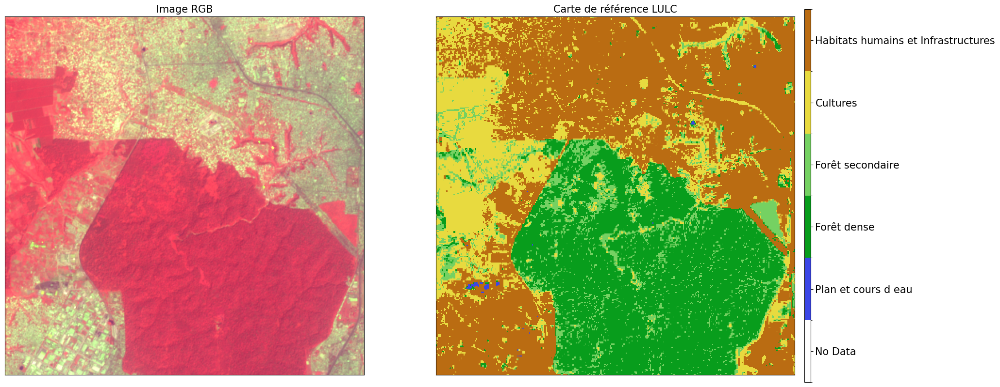

In [ ]:
# Chargement et visualisation de la carte de reference de l'eopache 12
# Loading and visualization of the eopache 12 reference map
eopatch_12 = EOPatch.load(os.path.join(EOPATCH_FOLDER, 'eopatch_12'), lazy_loading=True)

# Plot
fig, (ax1, ax2) = plt.subplots(1,2,figsize=(25,10))

_ = ax1.imshow(np.clip(eopatch_12.data['BANDS'][0][..., [8,11,4]] * 3.5, 0., 1.))
ref_map = ax2.imshow(eopatch_12.mask_timeless['LULC'][...,0], interpolation='nearest', cmap=lulc_cmap, norm=lulc_norm)

ax1.set_xticks([])
ax1.set_yticks([])
ax2.set_xticks([])
ax2.set_yticks([])
ax1.set_title('Image RGB', fontsize=15)
ax2.set_title('Carte de référence LULC', fontsize=15)

cb = fig.colorbar(ref_map, ax=[ax1, ax2], orientation='vertical', pad=0.01, aspect=60)
cb.set_ticks([entry.id for entry in LULC])
cb.ax.set_yticklabels([entry.class_name for entry in LULC], fontsize=15);

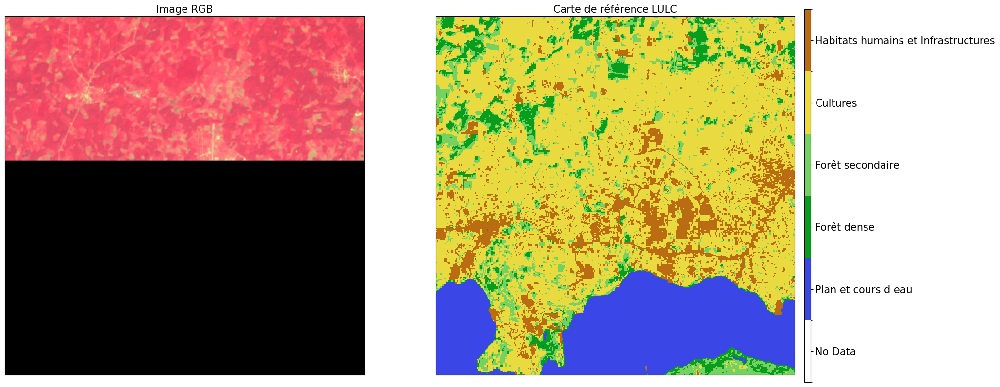

In [ ]:
# Chargement et visualisation de la carte de reference de l'eopache 17
# Loading and visualization of the eopache 17 reference map
eopatch_15 = EOPatch.load(os.path.join(EOPATCH_FOLDER, 'eopatch_15'), lazy_loading=True)

# Plot
fig, (ax1, ax2) = plt.subplots(1,2,figsize=(25,10))

_ = ax1.imshow(np.clip(eopatch_15.data['BANDS'][0][..., [8,11,4]] * 3.5, 0., 1.))
ref_map = ax2.imshow(eopatch_15.mask_timeless['LULC'][...,0], interpolation='nearest', cmap=lulc_cmap, norm=lulc_norm)

ax1.set_xticks([])
ax1.set_yticks([])
ax2.set_xticks([])
ax2.set_yticks([])
ax1.set_title('Image RGB', fontsize=15)
ax2.set_title('Carte de référence LULC', fontsize=15)

cb = fig.colorbar(ref_map, ax=[ax1, ax2], orientation='vertical', pad=0.01, aspect=60)
cb.set_ticks([entry.id for entry in LULC])
cb.ax.set_yticklabels([entry.class_name for entry in LULC], fontsize=15);

In [ ]:
# Chargement et visualisation de la carte de reference de l'eopache 17
# Loading and visualization of the eopache 17 reference map
eopatch_16 = EOPatch.load(os.path.join(EOPATCH_FOLDER, 'eopatch_16'), lazy_loading=True)

# Plot
fig, (ax1, ax2) = plt.subplots(1,2,figsize=(25,10))

_ = ax1.imshow(np.clip(eopatch_16.data['BANDS'][0][..., [8,11,4]] * 3.5, 0., 1.))
ref_map = ax2.imshow(eopatch_16.mask_timeless['LULC'][...,0], interpolation='nearest', cmap=lulc_cmap, norm=lulc_norm)

ax1.set_xticks([])
ax1.set_yticks([])
ax2.set_xticks([])
ax2.set_yticks([])
ax1.set_title('Image RGB', fontsize=15)
ax2.set_title('Carte de référence LULC', fontsize=15)

cb = fig.colorbar(ref_map, ax=[ax1, ax2], orientation='vertical', pad=0.01, aspect=60)
cb.set_ticks([entry.id for entry in LULC])
cb.ax.set_yticklabels([entry.class_name for entry in LULC], fontsize=15);

# Partie 2
Préparation des données d'entrainement


---

# Part 2
Preparation of training data

In [ ]:
class ValidDataFractionPredicate:
    """
      Prédicat qui définit si une trame de la série chronologique d'EOPatch est valide ou non.
      La trame est valide si la fraction de données valides est supérieure au seuil spécifié.
    ------------------------------------
      Predicate that defines if a frame from EOPatch's time-series is valid or not. Frame is valid if the
      valid data fraction is above the specified threshold.
    """

    def __init__(self, threshold):
        self.threshold = threshold

    def __call__(self, array):
        coverage = np.sum(array.astype(np.uint8)) / np.prod(array.shape)
        return coverage > self.threshold

In [ ]:
# LOAD EXISTING EOPATCHES
load = LoadTask(EOPATCH_FOLDER)

# FEATURE CONCATENATION
concatenate = MergeFeatureTask({FeatureType.DATA: ["BANDS", "NDVI", "NDWI", "NDBI"]}, (FeatureType.DATA, "FEATURES"))

# FILTER OUT CLOUDY SCENES
# Keep frames with > 80% valid coverage
valid_data_predicate = ValidDataFractionPredicate(0.9)
filter_task = SimpleFilterTask((FeatureType.MASK, "IS_VALID"), valid_data_predicate)

# LINEAR TEMPORAL INTERPOLATION
# linear interpolation of full time-series and date resampling
resampled_range = ("2022-12-10", "2022-1-15", 3)
linear_interp = LinearInterpolationTask(
    # nom du champ à interpoler
    # name of field to interpolate
    (FeatureType.DATA, "FEATURES"),
    # masque à utiliser dans l'interpolation
    # mask to be used in interpolation
    mask_feature=(FeatureType.MASK, "IS_VALID"),
    # fonctionnalités à conserver
    # features to keep
    copy_features=[(FeatureType.MASK_TIMELESS, "LULC")],
    resample_range=resampled_range,
)

# ÉROSION
# érode chaque classe de la carte de référence
# EROSION
# erode each class of the reference map
erosion = ErosionTask(mask_feature=(FeatureType.MASK_TIMELESS, "LULC", "LULC_ERODED"), disk_radius=1)

# ECHANTILLONNAGE SPATIAL
# Échantillonner uniformément les pixels des patchs
# SPATIAL SAMPLING
# Uniformly sample pixels from patches
lulc_type_ids = [lulc_type.id for lulc_type in LULC]

spatial_sampling = FractionSamplingTask(
    features_to_sample=[(FeatureType.DATA, "FEATURES", "FEATURES_SAMPLED"), (FeatureType.MASK_TIMELESS, "LULC_ERODED")],
    sampling_feature=(FeatureType.MASK_TIMELESS, "LULC_ERODED"),
    fraction=0.25,  # a quarter of points
    exclude_values=[0],
)

save = SaveTask(EOPATCH_SAMPLES_FOLDER, overwrite_permission=OverwritePermission.OVERWRITE_PATCH)

In [ ]:
# Définition du workflow
# Define the workflow
workflow_nodes = linearly_connect_tasks(load, concatenate, filter_task, linear_interp, erosion, spatial_sampling, save)
workflow = EOWorkflow(workflow_nodes)

In [ ]:
%%time
# Execution du workflow
# # Workflow execution
execution_args = []
for idx in range(len(patchIDs)):
    execution_args.append(
        {
            workflow_nodes[0]: {"eopatch_folder": f"eopatch_{idx}"},  # load / chargement
            workflow_nodes[-2]: {"seed": 42},  # sampling / echantillonnage
            workflow_nodes[-1]: {"eopatch_folder": f"eopatch_{idx}"},  # save / sauvegarde
        }
    )

executor = EOExecutor(workflow, execution_args, save_logs=True)
executor.run(workers=1)

executor.make_report()

failed_ids = executor.get_failed_executions()
if failed_ids:
    raise RuntimeError(
        f"Execution failed EOPatches with IDs:\n{failed_ids}\n"
        f"For more info check report at {executor.get_report_path()}"
    )

# Model construction and training
Les correctifs sont divisés en un sous-ensemble d'entraînement et de test, où nous divisons les correctifs pour la formation et les tests.L'échantillon de test est sélectionné à la main en raison du petit ensemble de patchs, sinon avec un grand ensemble global, les patchs d'entraînement et de test doivent être choisis au hasard.

Les entités et étiquettes échantillonnées sont chargées et remodelées en n*m
, où représente le nombre de pixels d'apprentissage, et m=f*t le nombre de toutes les caractéristiques (dans cet exemple 216), avec f la taille des bandes et des combinaisons de bandes (dans cet exemple 9) et la longueur de la série temporelle rééchantillonnée (dans cet exemple 25) LightGBM est utilisé comme modèle ML. Il s'agit d'un cadre d'amplification de gradient rapide, distribué et hautes performances basé sur des algorithmes d'arbre de décision, utilisé pour de nombreuses tâches d'apprentissage automatique.

Les hyper-paramètres par défaut sont utilisés dans cet exemple. Pour plus d'informations sur le réglage des paramètres, consultez les ReadTheDocs du package.

---

# Model de Construction et d'entrainement
The patches are split into a train and test subset, where we split the patches for training and testing.

The test sample is hand picked because of the small set of patches, otherwise with a larged overall set, the training and testing patches should be randomly chosen. The sampled features and labels are loaded and reshaped into n*m , where represents the number of training pixels, and m=f*t the number of all features (in this example 216), with f the size of bands and band combinations (in this example 9) and the length of the resampled time-series (in this example 25)

LightGBM is used as a ML model. It is a fast, distributed, high performance gradient boosting framework based on decision tree algorithms, used for many machine learning tasks. The default hyper-parameters are used in this example. For more info on parameter tuning, check the ReadTheDocs of the package.

In [ ]:
# Charger les eopatchs échantillonnés
# Load sampled eopatches
sampled_eopatches = []

for i in range(len(patchIDs)):
    sample_path = os.path.join(EOPATCH_SAMPLES_FOLDER, f"eopatch_{i}")
    sampled_eopatches.append(EOPatch.load(sample_path, lazy_loading=True))

sampled_eopatches

[EOPatch(
   data={
     FEATURES: FeatureIONumpy(/data/FEATURES.npy)
     FEATURES_SAMPLED: FeatureIONumpy(/data/FEATURES_SAMPLED.npy)
   }
   data_timeless={
     SCR_GBM: FeatureIONumpy(/data_timeless/SCR_GBM.npy)
   }
   mask_timeless={
     LBL_GBM: FeatureIONumpy(/mask_timeless/LBL_GBM.npy)
     LULC: FeatureIONumpy(/mask_timeless/LULC.npy)
     LULC_ERODED: FeatureIONumpy(/mask_timeless/LULC_ERODED.npy)
   }
   bbox=BBox(((368000.0, 608000.0), (376000.0, 616000.0)), crs=CRS('32630'))
   timestamps=[datetime.datetime(2022, 12, 10, 0, 0)]
 ),
 EOPatch(
   data={
     FEATURES: FeatureIONumpy(/data/FEATURES.npy)
     FEATURES_SAMPLED: FeatureIONumpy(/data/FEATURES_SAMPLED.npy)
   }
   data_timeless={
     SCR_GBM: FeatureIONumpy(/data_timeless/SCR_GBM.npy)
   }
   mask_timeless={
     LBL_GBM: FeatureIONumpy(/mask_timeless/LBL_GBM.npy)
     LULC: FeatureIONumpy(/mask_timeless/LULC.npy)
     LULC_ERODED: FeatureIONumpy(/mask_timeless/LULC_ERODED.npy)
   }
   bbox=BBox(((376000.0, 60

In [ ]:
"""
    Certaines classes peuvent ne pas être bien représentées dans notre petit exemple, il peut donc être judicieux de les exclure.
    Comptons leurs occurrences pour chaque patch :
    -------------------------
    Some classes may not be well represented in our small example, so it might make sense to exclude them.
    Let's count the occurrences for each patch:
"""
lulc_maps_list = []

for patch_name in os.listdir(EOPATCH_FOLDER):
    eopatch = EOPatch.load(os.path.join(EOPATCH_FOLDER, patch_name), lazy_loading=True)
    lulc_maps_list.append(eopatch.mask_timeless['LULC'][...,0])
    del eopatch

lulc_maps_list = np.array(lulc_maps_list)

# Labels
print('          ', np.unique(lulc_maps_list))

# Counts
for patch_name, lulc_map in zip(os.listdir(EOPATCH_FOLDER), lulc_maps_list):
    print(patch_name + ':', np.bincount(lulc_map.flatten()))

           [0 1 2 3 4 5]
eopatch_0: [     0   1037  73497 266606 296155   2705]
eopatch_1: [     0   1576  75635 198986 308472  55331]
eopatch_2: [     0    818  67183 209362 342321  20316]
eopatch_3: [     0   1642  64788 271681 286805  15084]
eopatch_4: [     0    534 168499 253024 216719   1224]
eopatch_5: [     0      9  55217  93407 402314  89053]
eopatch_6: [     0     12  16445  35069 330813 257661]
eopatch_7: [     0    335  18126  57382 267820 296337]
eopatch_8: [     0  22941  40826 145432 354801  76000]
eopatch_9: [     0  10048  95252 163666 354992  16042]
eopatch_10: [     0    205  19211  53531 498427  68626]
eopatch_11: [     0    716 188843  83344 163806 203291]
eopatch_12: [     0    126 124472  36972  69026 409404]
eopatch_13: [     0  15618  11050  46924 184867 381541]
eopatch_14: [     0 144665  30666  67489 302236  94944]
eopatch_15: [     0 175533  43058  50983 271535  98891]
eopatch_16: [     0 139005  14801  29434  78368 378392]
eopatch_17: [     0 177056  45697

In [ ]:
# Définition des identifiants d'entrainement et de patch de test, prendre 80 % pour l'entrainement
# Definition of the train and test patch IDs, take 80 % for train
test_ID = [1, 7, 12, 17]
test_eopatches = [sampled_eopatches[i] for i in test_ID]
train_ID = [i for i in range(len(patchIDs)) if i not in test_ID]
train_eopatches = [sampled_eopatches[i] for i in train_ID]

# Définissez les fonctionnalités et les étiquettes pour les ensembles d'entraînement et de test
# Set the features and the labels for train and test sets
features_train = np.concatenate([eopatch.data["FEATURES_SAMPLED"] for eopatch in train_eopatches], axis=1)
labels_train = np.concatenate([eopatch.mask_timeless["LULC_ERODED"] for eopatch in train_eopatches], axis=0)


features_test = np.concatenate([eopatch.data["FEATURES_SAMPLED"] for eopatch in test_eopatches], axis=1)
labels_test = np.concatenate([eopatch.mask_timeless["LULC_ERODED"] for eopatch in test_eopatches], axis=0)

# Obtention du shape d'entrainement
# Get shape
t, w1, h, f = features_train.shape
t, w2, h, f = features_test.shape

# Remodeler à n x m
# Reshape to n x m
features_train = np.moveaxis(features_train, 0, 1).reshape(w1 * h, t * f)
labels_train = labels_train.reshape(w1 * h)
features_test = np.moveaxis(features_test, 0, 1).reshape(w2 * h, t * f)
labels_test = labels_test.reshape(w2 * h)

In [ ]:
features_train.shape

(2614271, 15)

In [ ]:
%%time

# Set up training classes
labels_unique = np.unique(labels_train)

# Set up the model
model = lgb.LGBMClassifier(
    objective="multiclass", num_class=len(labels_unique), metric="multi_logloss", random_state=42
)

# Train the model
model.fit(features_train, labels_train)

# Save the model
joblib.dump(model, os.path.join(RESULTS_FOLDER, "model_SI_LULC_Abidjan_1.pkl"))

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.120682 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3825
[LightGBM] [Info] Number of data points in the train set: 2614271, number of used features: 15
[LightGBM] [Info] Start training from score -1.475108
[LightGBM] [Info] Start training from score -2.709111
[LightGBM] [Info] Start training from score -2.169920
[LightGBM] [Info] Start training from score -0.979228
[LightGBM] [Info] Start training from score -1.537758
CPU times: user 2min 16s, sys: 381 ms, total: 2min 17s
Wall time: 2min 18s


['./results/model_SI_LULC_Abidjan_1.pkl']

# Validation
Bien que les chiffres selon différentes métriques soient indicatifs des performances, pour mieux évaluer le comportement du modèle et voir ce qu'il fait réellement, nous devrons aller un peu plus loin.

In [ ]:
# Chargement du model
# Load the model
model_path = os.path.join(RESULTS_FOLDER, "model_SI_LULC_Abidjan_1.pkl")
model = joblib.load(model_path)

# Prédire les étiquettes de test
# Predict the test labels
predicted_labels_test = model.predict(features_test)

In [ ]:
"""2.1 Notes
     Tout d'abord, les scores peuvent sensiblement différer entre les classes
    -------------------------
    2.1 Scores
    First of all, the scores may notably differ between the classes
"""

class_labels = np.unique(labels_test)
class_names = [lulc_type.name for lulc_type in LULC]
mask = np.in1d(predicted_labels_test, labels_test)
predictions = predicted_labels_test[mask]
true_labels = labels_test[mask]

# Extract and display metrics
f1_scores = metrics.f1_score(true_labels, predictions, labels=class_labels, average=None)
avg_f1_score = metrics.f1_score(true_labels, predictions, average="weighted")
recall = metrics.recall_score(true_labels, predictions, labels=class_labels, average=None)
precision = metrics.precision_score(true_labels, predictions, labels=class_labels, average=None)
accuracy = metrics.accuracy_score(true_labels, predictions)

print("Précision du classement {:.1f}%".format(100 * accuracy))
print("Classification F1-score {:.1f}%".format(100 * avg_f1_score))
print()
print("             Class              =  F1  | Rappeler | Precision")
print("         --------------------------------------------------")
for idx, lulctype in enumerate([class_names[idx] for idx in class_labels]):
    line_data = (lulctype, f1_scores[idx] * 100, recall[idx] * 100, precision[idx] * 100)
    print("         * {0:20s} = {1:2.1f} |  {2:2.1f}  | {3:2.1f}".format(*line_data))

Précision du classement 91.1%
Classification F1-score 90.9%

             Class              =  F1  | Rappeler | Precision
         --------------------------------------------------
         * Plan_cours_d_eau     = 99.3 |  98.9  | 99.8
         * Frt_Dnse             = 78.1 |  69.4  | 89.3
         * Forêt_secd           = 67.4 |  62.0  | 73.9
         * Cultures             = 85.6 |  91.4  | 80.5
         * Habitats_Infrastructures = 98.4 |  98.6  | 98.2


# Matrice de confusion
Pour la plupart des classes, le modèle semble bien fonctionner. Sinon, l'échantillon d'apprentissage est probablement trop petit pour faire une évaluation juste. Des problèmes supplémentaires surviennent en raison de l'ensemble de formation déséquilibré. L'image ci-dessous montre la fréquence des classes utilisées pour l'entraînement du modèle, et on voit que les cas problématiques sont toutes les classes sous-représentées : maquis, eau, marécage et terrain nu.


---
# Confusion Matrix
For most of the classes the model seems to perform well. Otherwise the training sample is probably too small to make a fair assesment. Additional problems arise due to the unbalanced training set. The image below shows the frequency of the classes used for model training, and we see that the problematic cases are all the under-represented classes: shrubland, water, wetland, and bareland.


In [ ]:
# Définir la fonction de traçage
# Define the plotting function
def plot_confusion_matrix(
    confusion_matrix,
    classes,
    normalize=False,
    title="Matrix de confusion",
    cmap=plt.cm.Blues,
    ylabel="True label",
    xlabel="Predicted label",
    filename=None,
):
    """
      Cette fonction imprime et trace la matrice de confusion.
      La normalisation peut être appliquée en définissant `normalize=True`.
    ------------------------
      This function prints and plots the confusion matrix.
      Normalization can be applied by setting `normalize=True`.
    """
    np.set_printoptions(precision=2, suppress=True)

    if normalize:
        normalisation_factor = confusion_matrix.sum(axis=1)[:, np.newaxis] + np.finfo(float).eps
        confusion_matrix = confusion_matrix.astype("float") / normalisation_factor

    plt.imshow(confusion_matrix, interpolation="nearest", cmap=cmap, vmin=0, vmax=1)
    plt.title(title, fontsize=20)
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=90, fontsize=20)
    plt.yticks(tick_marks, classes, fontsize=20)

    fmt = ".2f" if normalize else "d"
    threshold = confusion_matrix.max() / 1.0
    for i, j in itertools.product(range(confusion_matrix.shape[0]), range(confusion_matrix.shape[1])):
        plt.text(
            j,
            i,
            format(confusion_matrix[i, j], fmt),
            horizontalalignment="center",
            color="white" if confusion_matrix[i, j] > threshold else "black",
            fontsize=12,
        )

    plt.tight_layout()
    plt.ylabel(ylabel, fontsize=20)
    plt.xlabel(xlabel, fontsize=20)

Le modèle semble généralement bien fonctionner, en particulier si l'on considère qu'il peut y avoir des erreurs dans les données de référence (vérité terrain).

---

The model seems to mostly perform well, particularly if we consider that there may be some errors in the reference data (ground truth).

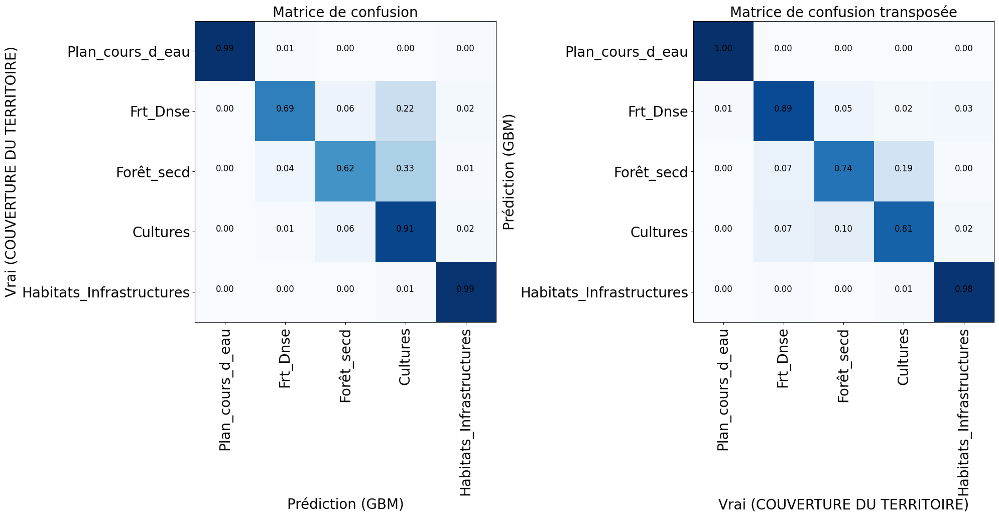

In [ ]:
fig = plt.figure(figsize=(20, 20))

plt.subplot(1, 2, 1)
confusion_matrix_gbm = metrics.confusion_matrix(true_labels, predictions)
plot_confusion_matrix(
    confusion_matrix_gbm,
    classes=[name for idx, name in enumerate(class_names) if idx in class_labels],
    normalize=True,
    ylabel="Vrai (COUVERTURE DU TERRITOIRE)",
    xlabel="Prédiction (GBM)",
    title="Matrice de confusion",
)

plt.subplot(1, 2, 2)
confusion_matrix_gbm = metrics.confusion_matrix(predictions, true_labels)
plot_confusion_matrix(
    confusion_matrix_gbm,
    classes=[name for idx, name in enumerate(class_names) if idx in class_labels],
    normalize=True,
    xlabel="Vrai (COUVERTURE DU TERRITOIRE)",
    ylabel="Prédiction (GBM)",
    title="Matrice de confusion transposée",
)

plt.tight_layout()

In [ ]:
import pandas as pd

# Calculer les mesures de performance
accuracy = metrics.accuracy_score(true_labels, predictions)
precision = metrics.precision_score(true_labels, predictions, average="weighted")
recall = metrics.recall_score(true_labels, predictions, average="weighted")
f1_score = metrics.f1_score(true_labels, predictions, average="weighted")

# Créer un DataFrame avec les mesures de performance
data = {
    "Mesure": ["Exactitude", "Précision", "Rappel", "Score F1"],
    "Valeur": [accuracy, precision, recall, f1_score]
}
df = pd.DataFrame(data)

# Afficher le tableau
print(df)

       Mesure    Valeur
0  Exactitude  0.910812
1   Précision  0.911458
2      Rappel  0.910812
3    Score F1  0.908724


L'exception est la classe "arbustes", qui est la moins représentée dans notre ensemble d'entraînement

---


The exception is the "shrubland" class, which is the least represented in our training set

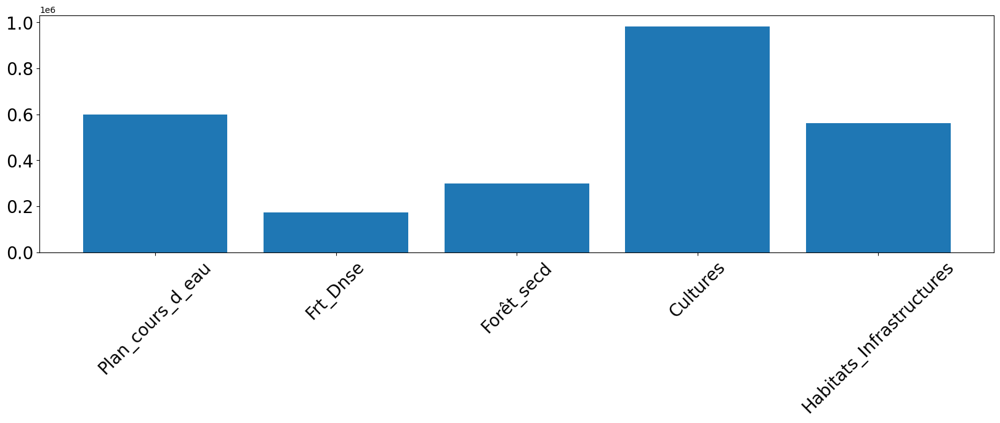

In [ ]:
fig = plt.figure(figsize=(20, 5))

label_ids, label_counts = np.unique(labels_train, return_counts=True)

plt.bar(range(len(label_ids)), label_counts)
plt.xticks(range(len(label_ids)), [class_names[i] for i in label_ids], rotation=45, fontsize=20)
plt.yticks(fontsize=20);

In [ ]:
# Supposons que la taille d'un pixel en mètres carrés soit connue
pixel_size_m2 = 10  # Par exemple, 10 mètres carrés par pixel

# Calculer la taille en hectares d'un pixel
pixel_size_hectares = pixel_size_m2 / 10000  # 1 hectare = 10 000 mètres carrés

# Calculer la répartition en hectares pour chaque classe
class_area_hectares = {}
for class_id in np.unique(labels_train):
    # Compter le nombre de pixels pour cette classe
    pixels_in_class = np.sum(labels_train == class_id)

    # Convertir le nombre de pixels en hectares
    area_hectares = pixels_in_class * pixel_size_hectares

    # Ajouter la répartition en hectares pour cette classe dans le dictionnaire
    class_name = class_names[class_id]
    class_area_hectares[class_name] = area_hectares

# Afficher la répartition en hectares
for class_name, area_hectares in class_area_hectares.items():
    print(f"Classe '{class_name}': {area_hectares:.2f} hectares")

Classe 'Plan_cours_d_eau': 598.02 hectares
Classe 'Frt_Dnse': 174.10 hectares
Classe 'Forêt_secd': 298.51 hectares
Classe 'Cultures': 981.92 hectares
Classe 'Habitats_Infrastructures': 561.71 hectares


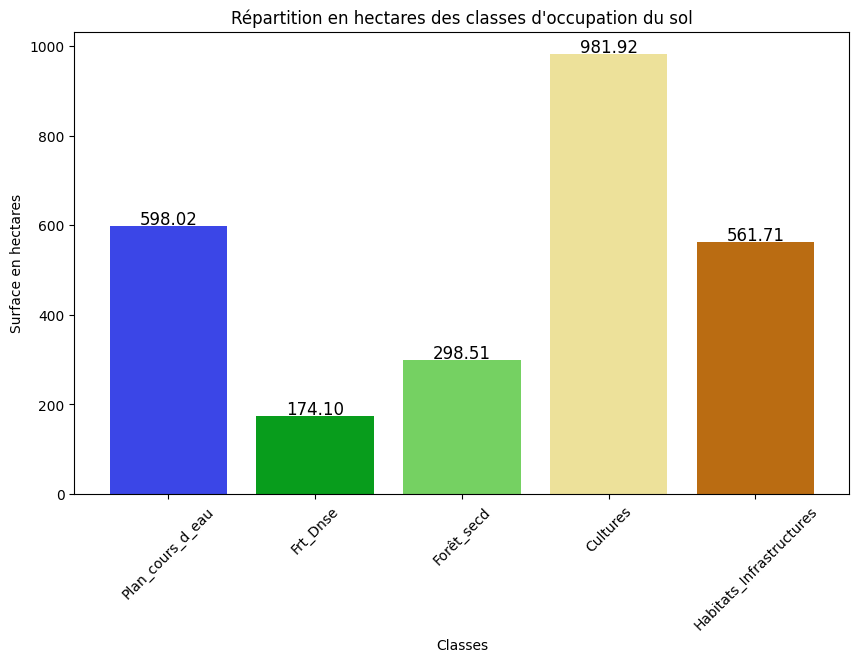

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Supposons que vous avez déjà calculé class_area_hectares comme indiqué précédemment

# Extraire les noms de classe et les aires en hectares
class_names = list(class_area_hectares.keys())
class_areas = list(class_area_hectares.values())

# Couleurs pour les barres
colors = {
    "Plan_cours_d_eau": "#3b46e7",
    "Frt_Dnse": "#089d1c",
    "Forêt_secd": "#75d162",
    "Cultures": "#ede19a",
    "Habitats_Infrastructures": "#ba6c12"
}

# Créer le graphique à barres en couleur avec des chiffres à l'intérieur des barres
plt.figure(figsize=(10, 6))
bars = plt.bar(class_names, class_areas, color=[colors[class_name] for class_name in class_names])

# Ajouter des étiquettes et un titre
plt.xlabel("Classes")
plt.ylabel("Surface en hectares")
plt.title("Répartition en hectares des classes d'occupation du sol")

# Ajouter les chiffres à l'intérieur des barres
for bar, area in zip(bars, class_areas):
    plt.text(bar.get_x() + bar.get_width() / 2, bar.get_height() + 5, f"{area:.2f}", ha="center", fontsize=12)

# Afficher le graphique
plt.xticks(rotation=45)
plt.show()

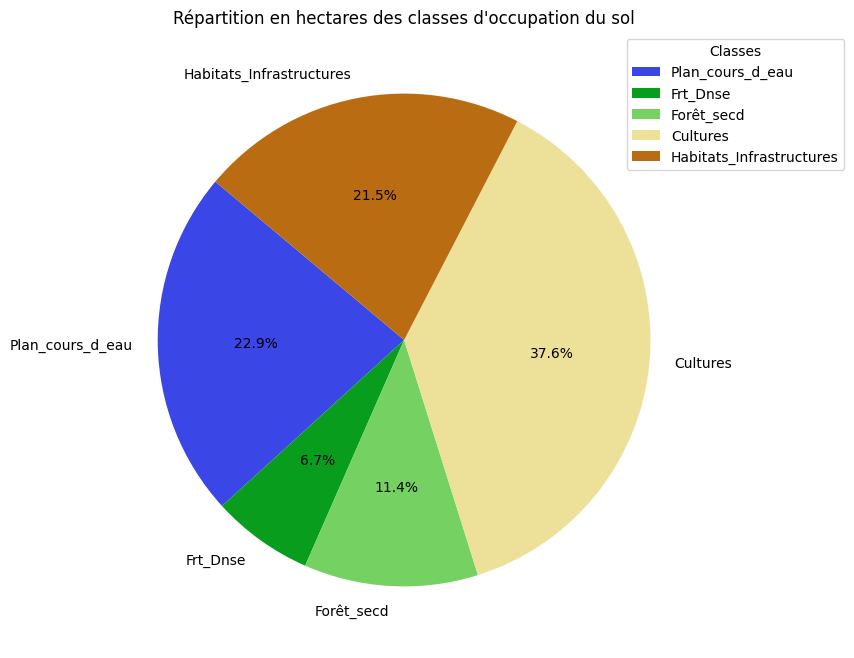

In [ ]:
import matplotlib.pyplot as plt

# Supposons que vous avez déjà calculé class_area_hectares comme indiqué précédemment

# Extraire les noms de classe et les aires en hectares
class_names = list(class_area_hectares.keys())
class_areas = list(class_area_hectares.values())

# Couleurs pour les classes
colors = {
    "Plan_cours_d_eau": "#3b46e7",
    "Frt_Dnse": "#089d1c",
    "Forêt_secd": "#75d162",
    "Cultures": "#ede19a",
    "Habitats_Infrastructures": "#ba6c12"
}

# Créer un graphique en forme de camembert
plt.figure(figsize=(8, 8))
plt.pie(class_areas, labels=class_names, colors=[colors[class_name] for class_name in class_names], autopct='%1.1f%%', startangle=140)

# Ajouter un titre
plt.title("Répartition en hectares des classes d'occupation du sol")

# Afficher la légende en bas
plt.legend(loc="upper left", labels=class_names, title="Classes", bbox_to_anchor=(0.85, 0, 0.5, 1))

plt.show()

*Courbes* ROC et métriques AUC

Calculez les taux de précision et de rappel, tracez des courbes ROC et calculez l'AUC.

La courbe ROC (caractéristique de fonctionnement du récepteur) est définie en termes de taux de vrais positifs (TPR) et de taux de faux positifs (FPR) car le seuil qui sépare une classe des autres est décalé.

L'observation de la courbe ROC et le calcul de l'aire sous celle-ci (AUC) peuvent donc être utiles pour évaluer la séparation des différentes classes du modèle.

---



ROC curves and AUC metrics

Calculate precision and recall rates, draw ROC curves and calculate AUC.

The ROC (receiver operating characteristic) curve is defined in terms of true positive rate (TPR) and false positive rate (FPR) as the threshold that separates one class against the others is shifted.

Observing the ROC curve and calculating the area under it (AUC) can thus be useful in evaluating the model's separation of different classes.

In [ ]:
class_labels = np.unique(np.hstack([labels_test, labels_train]))

scores_test = model.predict_proba(features_test)
labels_binarized = preprocessing.label_binarize(labels_test, classes=class_labels)

fpr, tpr, roc_auc = {}, {}, {}

for idx, lbl in enumerate(class_labels):
    fpr[idx], tpr[idx], _ = metrics.roc_curve(labels_binarized[:, idx], scores_test[:, idx])
    roc_auc[idx] = metrics.auc(fpr[idx], tpr[idx])

IndexError: ignored

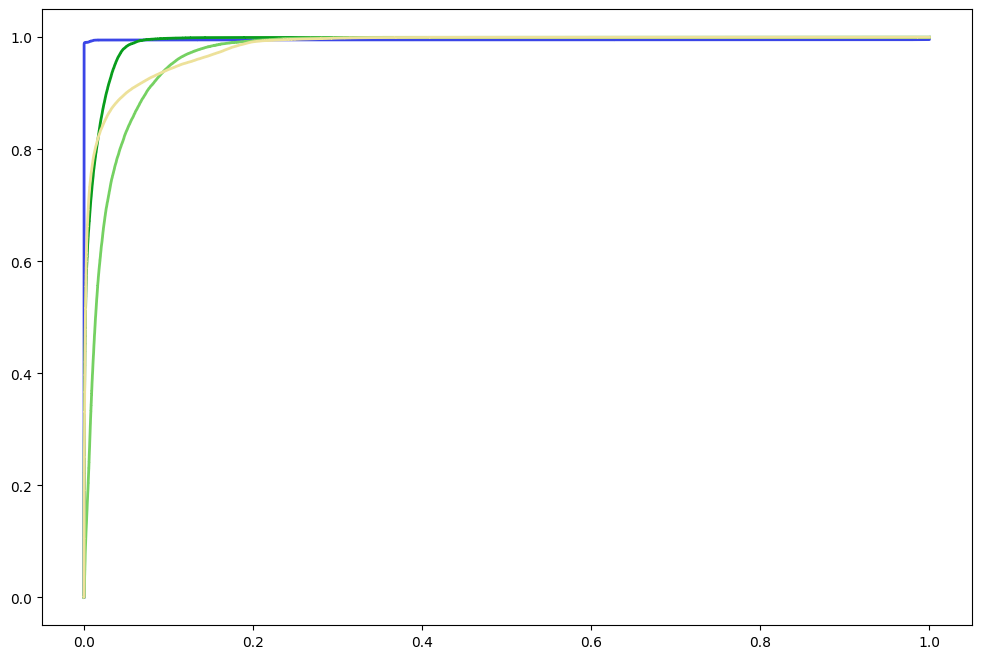

In [ ]:
import matplotlib.patches as mpatches

plt.figure(figsize=(12, 8))

# Liste des couleurs pour les courbes ROC
colors = [lulc_cmap.colors[lbl] for lbl in class_labels]

for idx, lbl in enumerate(class_labels):
    if np.isnan(roc_auc[idx]):
        continue
    plt.plot(
        fpr[idx],
        tpr[idx],
        color=colors[idx],
        lw=2,
        label=class_names[lbl] + " ({:0.5f})".format(roc_auc[idx]),
    )

# Ligne en pointillés représentant la ligne de référence
plt.plot([0, 1], [0, 1], color="gray", lw=2, linestyle="--")

plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])

# Légende avec les couleurs correspondant aux classes
legend_patches = [
    mpatches.Patch(color=colors[idx], label=class_names[lbl]) for idx, lbl in enumerate(class_labels)
]
plt.legend(handles=legend_patches, loc="lower right", prop={"size": 12})

plt.xlabel("Taux de faux positifs", fontsize=14)
plt.ylabel("Taux de vrais positifs", fontsize=14)
plt.title("Courbes ROC", fontsize=16)

plt.xticks(fontsize=12)
plt.yticks(fontsize=12)

plt.grid(True)

plt.show()


# Interprétabilité

Les arbres de décision peuvent suivre le nombre de fois où chaque fonctionnalité a été utilisée pour effectuer une scission lors de la construction d'un arbre (ou d'une forêt) particulier. Ceci (ou le gain d'information cumulé) peut indiquer quelles caractéristiques sont "plus importantes" que d'autres, du moins pour notre modèle.

---

# Interpretability

Decision trees can track the number of times that each feature was used to make a split when building a particular tree (or forest). This (or the cumulative information gain) can indicate which features are "more important" than others, at least to our model.

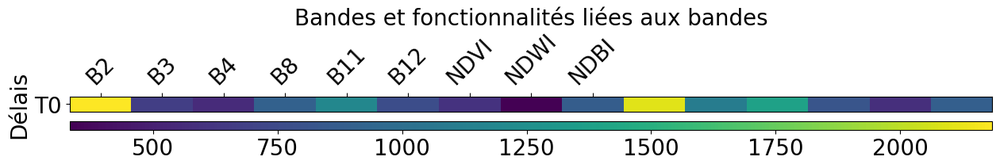

In [ ]:
# Noms des fonctionnalités
# Feature names
fnames = ["B2", "B3", "B4", "B8", "B11", "B12", "NDVI", "NDWI", "NDBI"]

# Obtenez l'importance des fonctionnalités et remodelez-les en fonction des dates et des fonctionnalités
# Get feature importances and reshape them to dates and features
feature_importances = model.feature_importances_.reshape((t, f))

fig = plt.figure(figsize=(15, 15))
ax = plt.gca()

# Tracer les importances
# Plot the importances
im = ax.imshow(feature_importances, aspect=0.25)
plt.xticks(range(len(fnames)), fnames, rotation=45, fontsize=20)
plt.yticks(range(t), [f"T{i}" for i in range(t)], fontsize=20)
plt.xlabel("Bandes et fonctionnalités liées aux bandes", fontsize=20)
plt.ylabel("Délais", fontsize=20)
ax.xaxis.tick_top()
ax.xaxis.set_label_position("top")

fig.subplots_adjust(wspace=0, hspace=0)

cb = fig.colorbar(im, ax=[ax], orientation="horizontal", pad=0.01, aspect=100)
cb.ax.tick_params(labelsize=20)

# Visualisation des résultats
Le modèle a été validé, il ne reste plus qu'à faire la prédiction sur l'ensemble de l'AOI. Ici, nous définissons un workflow pour faire la prédiction du modèle sur les EOPatces existants. L'EOTask accepte les caractéristiques et les noms des étiquettes et des scores. Ce dernier est facultatif.

---

# Visualization of the results
The model has been validated, the remaining thing is to make the prediction on the whole AOI. Here we define a workflow to make the model prediction on the existing EOPatces. The EOTask accepts the features and the names for the labels and scores. The latter is optional.

In [ ]:
# Draw the RGB image
fig, axs = plt.subplots(nrows=5, ncols=5, figsize=(20, 20))

time_id = np.where(feature_importances == np.max(feature_importances))[0][0]

for i in tqdm(range(len(patchIDs))):
    sample_path = os.path.join(EOPATCH_SAMPLES_FOLDER, f"eopatch_{i}")
    eopatch = EOPatch.load(sample_path, lazy_loading=True)
    ax = axs[i // 5][i % 5]
    ax.imshow(np.clip(eopatch.data["FEATURES"][time_id][..., [2, 1, 0]] * 2.5, 0, 1))
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_aspect("auto")
    del eopatch

fig.subplots_adjust(wspace=0, hspace=0)

In [ ]:
class PredictPatchTask(EOTask):
    """
    Tâche de faire des prédictions de modèle sur un patch.
    Fournissez le modèle et la fonctionnalité, ainsi que les noms de sortie des étiquettes et des scores (facultatif)
    --------------
    Task to make model predictions on a patch. Provide the model and the feature,
    and the output names of labels and scores (optional)
    """

    def __init__(self, model, features_feature, predicted_labels_name, predicted_scores_name=None):
        self.model = model
        self.features_feature = features_feature
        self.predicted_labels_name = predicted_labels_name
        self.predicted_scores_name = predicted_scores_name

    def execute(self, eopatch):
        features = eopatch[self.features_feature]

        t, w, h, f = features.shape
        features = np.moveaxis(features, 0, 2).reshape(w * h, t * f)

        predicted_labels = self.model.predict(features)
        predicted_labels = predicted_labels.reshape(w, h)
        predicted_labels = predicted_labels[..., np.newaxis]
        eopatch[(FeatureType.MASK_TIMELESS, self.predicted_labels_name)] = predicted_labels

        if self.predicted_scores_name:
            predicted_scores = self.model.predict_proba(features)
            _, d = predicted_scores.shape
            predicted_scores = predicted_scores.reshape(w, h, d)
            eopatch[(FeatureType.DATA_TIMELESS, self.predicted_scores_name)] = predicted_scores

        return eopatch

In [ ]:
# LOAD EXISTING EOPATCHES
load = LoadTask(EOPATCH_SAMPLES_FOLDER)

# PREDICT
predict = PredictPatchTask(model, (FeatureType.DATA, "FEATURES"), "LBL_GBM", "SCR_GBM")

# SAVE
save = SaveTask(EOPATCH_SAMPLES_FOLDER, overwrite_permission=OverwritePermission.OVERWRITE_PATCH)

# EXPORT TIFF
export_tiff = ExportToTiffTask((FeatureType.MASK_TIMELESS, "LBL_GBM"), "./tmp")
tiff_location = os.path.join(RESULTS_FOLDER, "predicted_tiff")
os.makedirs(tiff_location, exist_ok=True)

workflow_nodes = linearly_connect_tasks(load, predict, export_tiff, save)
workflow = EOWorkflow(workflow_nodes)

Define Tasks and the Workflow

In [ ]:
# CHARGER LES EOPATCHS EXISTANTS
# LOAD EXISTING EOPATCHES
load = LoadTask(EOPATCH_SAMPLES_FOLDER)

# PREDICTION
# PREDICT
predict = PredictPatchTask(model, (FeatureType.DATA, "FEATURES"), "LBL_GBM", "SCR_GBM")

# SAUVERGADE
# SAVE
save = SaveTask(EOPATCH_SAMPLES_FOLDER, overwrite_permission=OverwritePermission.OVERWRITE_PATCH)

# EXPORTATION EN FICHIER TIFF
# EXPORT TIFF
export_tiff = ExportToTiffTask((FeatureType.MASK_TIMELESS, "LBL_GBM"), "./tmp")
tiff_location = os.path.join(RESULTS_FOLDER, "predicted_tiff")
os.makedirs(tiff_location, exist_ok=True)

workflow_nodes = linearly_connect_tasks(load, predict, export_tiff, save)
workflow = EOWorkflow(workflow_nodes)

In [ ]:
# Créer une liste d'arguments d'exécution pour chaque patch
# Create a list of execution arguments for each patch
execution_args = []
for i in range(len(patchIDs)):
    execution_args.append(
        {
            workflow_nodes[0]: {"eopatch_folder": f"eopatch_{i}"},
            workflow_nodes[2]: {"filename": f"{tiff_location}/prediction_eopatch_{i}.tiff"},
            workflow_nodes[3]: {"eopatch_folder": f"eopatch_{i}"},
        }
    )

# Lancer l'exécuteur
# Run the executor
executor = EOExecutor(workflow, execution_args)
executor.run(workers=1, multiprocess=False)
executor.make_report()

failed_ids = executor.get_failed_executions()
if failed_ids:
    raise RuntimeError(
        f"Execution failed EOPatches with IDs:\n{failed_ids}\n"
        f"For more info check report at {executor.get_report_path()}"
    )

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

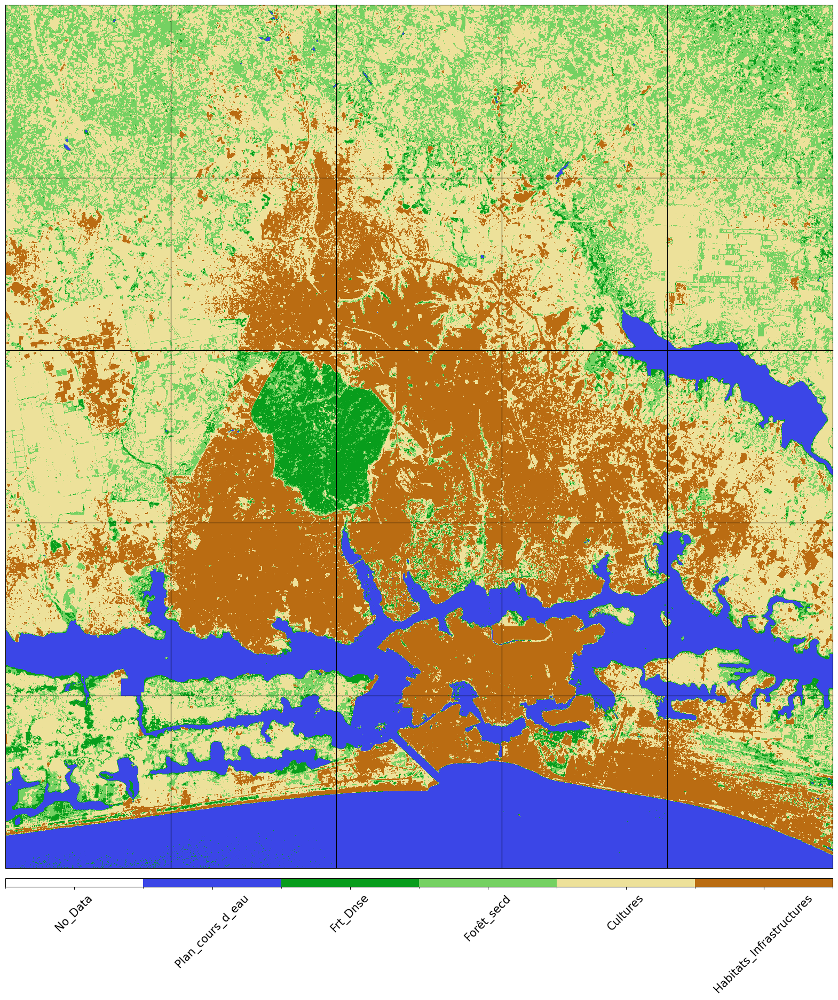

In [ ]:
fig, axs = plt.subplots(nrows=5, ncols=5, figsize=(20, 25))

for i in tqdm(range(len(patchIDs))):
    eopatch_path = os.path.join(EOPATCH_SAMPLES_FOLDER, f"eopatch_{i}")
    eopatch = EOPatch.load(eopatch_path, lazy_loading=True)
    ax = axs[i // 5][i % 5]
    im = ax.imshow(eopatch.mask_timeless["LBL_GBM"].squeeze(), cmap=lulc_cmap, norm=lulc_norm)
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_aspect("auto")
    del eopatch

fig.subplots_adjust(wspace=0, hspace=0)

cb = fig.colorbar(im, ax=axs.ravel().tolist(), orientation="horizontal", pad=0.01, aspect=100)
cb.ax.tick_params(labelsize=20)
cb.set_ticks([entry.id for entry in LULC])
cb.ax.set_xticklabels([entry.name for entry in LULC], rotation=45, fontsize=15)
plt.show()

In [ ]:
time_id = 0  # Exemple de déclaration et d'initialisation de la variable time_id
for i in tqdm(range(len(patchIDs))):
    eopatch_path = os.path.join(EOPATCH_SAMPLES_FOLDER, f"eopatch_{i}")
    eopatch = EOPatch.load(eopatch_path, lazy_loading=True)

    fig, (ax1, ax2) = plt.subplots(nrows=1, ncols=2, figsize=(12, 6))

    # Affichage de l'image RGB
    rgb_image = eopatch.data["FEATURES"][time_id][..., [8, 11, 4]]
    ax1.imshow(np.clip(rgb_image * 2.5, 0, 1))
    ax1.set_xticks([])
    ax1.set_yticks([])
    ax1.set_aspect("auto")

    # Affichage de l'image de classification
    classification_image = eopatch.mask_timeless["LBL_GBM"].squeeze()
    im2 = ax2.imshow(classification_image, cmap=lulc_cmap, norm=lulc_norm)
    ax2.set_xticks([])
    ax2.set_yticks([])
    ax2.set_aspect("auto")

    # Barre de couleur pour l'image de classification
    cb = fig.colorbar(im2, ax=ax2, orientation="horizontal", pad=0.01, aspect=100)
    cb.ax.tick_params(labelsize=10)
    cb.set_ticks([entry.id for entry in LULC])
    cb.ax.set_xticklabels([entry.name for entry in LULC], rotation=45, fontsize=8)

    plt.show()


# Divergence

En y regardant de plus près, nous pouvons observer que les différences se situent principalement à la frontière entre différentes structures ou appartiennent à des structures de choses, telles que les forets et zones artificiels.

---


# Discrepancy

Looking closer, we can observe that the differences are mainly on the boundary between different structures or belong to structures of things, such as man-made forests and areas.

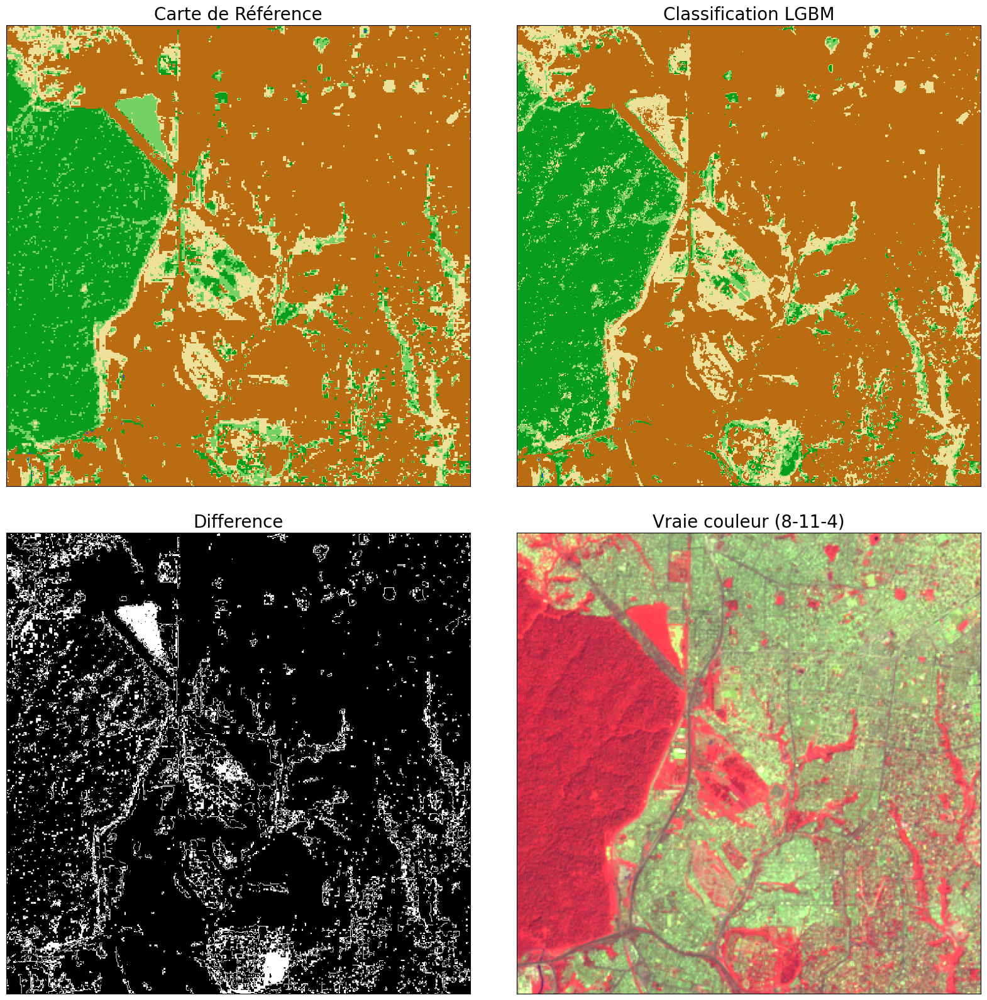

In [ ]:
# Dessinez la carte de référence
# Draw the Reference map
fig = plt.figure(figsize=(20, 20))

idx = np.random.choice(range(len(patchIDs)))
inspect_size = 750  # Taille d'inspection plus grande

eopatch = EOPatch.load(os.path.join(EOPATCH_SAMPLES_FOLDER, f"eopatch_{idx}"), lazy_loading=True)

w, h = eopatch.mask_timeless["LULC"].squeeze().shape

w_min = np.random.choice(range(w - inspect_size))
w_max = w_min + inspect_size
h_min = np.random.choice(range(h - inspect_size))
h_max = h_min + inspect_size

ax = plt.subplot(2, 2, 1)
plt.imshow(eopatch.mask_timeless["LULC"].squeeze()[w_min:w_max, h_min:h_max], cmap=lulc_cmap, norm=lulc_norm)
plt.xticks([])
plt.yticks([])
ax.set_aspect("auto")
plt.title("Carte de Référence", fontsize=20)

try:
    ax = plt.subplot(2, 2, 2)
    plt.imshow(eopatch.mask_timeless["LBL_GBM"].squeeze()[w_min:w_max, h_min:h_max], cmap=lulc_cmap, norm=lulc_norm)
    plt.xticks([])
    plt.yticks([])
    ax.set_aspect("auto")
    plt.title("Classification LGBM", fontsize=20)
except IndexError:
    plt.subplot(2, 2, 2)
    plt.xticks([])
    plt.yticks([])
    plt.title("Prediction - Error", fontsize=20)

ax = plt.subplot(2, 2, 3)
mask = eopatch.mask_timeless["LBL_GBM"].squeeze() != eopatch.mask_timeless["LULC"].squeeze()
plt.imshow(mask[w_min:w_max, h_min:h_max], cmap="gray")
plt.xticks([])
plt.yticks([])
ax.set_aspect("auto")
plt.title("Difference", fontsize=20)

try:
    ax = plt.subplot(2, 2, 4)
    image = np.clip(eopatch.data["FEATURES"][0][..., [8, 11, 4]] * 3.5, 0, 1)  # Utilisation de 8-11-4 pour les vraies couleurs
    plt.imshow(image[w_min:w_max, h_min:h_max])
    plt.xticks([])
    plt.yticks([])
    ax.set_aspect("auto")
    plt.title("Vraie couleur (8-11-4)", fontsize=20)
except IndexError:
    plt.subplot(2, 2, 4)
    plt.xticks([])
    plt.yticks([])
    plt.title("Vraie couleur - Error", fontsize=20)

fig.subplots_adjust(wspace=0.1, hspace=0.1)
plt.show()

<ipython-input-64-2b0b99bec8bb>:54: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


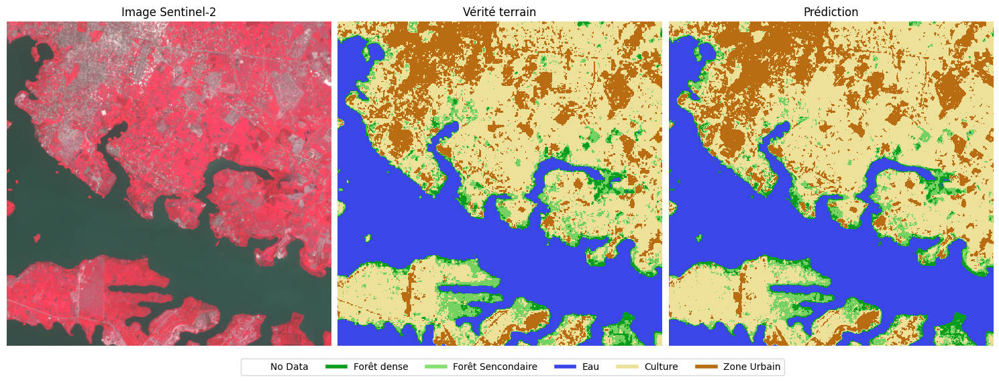

In [ ]:
import random
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import ImageGrid

# Sélectionnez un EOPatch aléatoire
random_idx = random.choice(range(len(patchIDs)))
eopatch_path = os.path.join(EOPATCH_SAMPLES_FOLDER, f"eopatch_{random_idx}")
eopatch = EOPatch.load(eopatch_path, lazy_loading=True)

# Obtenez les images et les cartes de référence
image = eopatch.data["FEATURES"][0][..., [7, 3, 4]] * 3.5
lulc_reference = eopatch.mask_timeless["LULC"].squeeze()
lulc_prediction = eopatch.mask_timeless["LBL_GBM"].squeeze()

# Créez une figure avec une grille d'images
fig = plt.figure(figsize=(15, 6))
grid = ImageGrid(fig, 111, nrows_ncols=(1, 3), axes_pad=0.1)

# Affichez l'image Sentinel-2 à gauche
ax1 = grid[0]
im1 = ax1.imshow(image)
ax1.set_title("Image Sentinel-2")
ax1.axis("off")

# Affichez la carte de référence au centre
ax2 = grid[1]
im2 = ax2.imshow(lulc_reference, cmap=lulc_cmap, norm=lulc_norm)
ax2.set_title("Vérité terrain")
ax2.axis("off")

# Affichez la carte de prédiction à droite
ax3 = grid[2]
im3 = ax3.imshow(lulc_prediction, cmap=lulc_cmap, norm=lulc_norm)
ax3.set_title("Prédiction")
ax3.axis("off")

# Créer la légende
LULC_legend = {
    0: ("No Data", "white"),
    1: ("Forêt dense", "#089d1c"),
    2: ("Forêt Sencondaire", "#85e16e"),
    3: ("Eau", "#3b46e7"),
    4: ("Culture", "#ede19a"),
    5: ("Zone Urbain", "#ba6c12"),
}
legend_elements = [plt.Line2D([0], [0], color=color, lw=4, label=label) for label, color in LULC_legend.values()]
legend = plt.legend(handles=legend_elements, loc="lower center", bbox_to_anchor=(0.5, -0.15), ncol=len(LULC_legend),
                    fontsize=10)
plt.subplots_adjust(bottom=0.25)

# Ajouter la légende à la figure
fig.add_artist(legend)

plt.tight_layout()
plt.show()


In [ ]:
import os
import random
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import ImageGrid

# Réglage de la plage de valeurs pour augmenter la luminosité
brightness_factor = 2.0  # Vous pouvez ajuster ce facteur pour augmenter ou réduire la luminosité

# Parcourez les EOPatches de 0 à 24
for idx in range(25):
    # Sélectionnez un EOPatch
    eopatch_path = os.path.join(EOPATCH_SAMPLES_FOLDER, f"eopatch_{idx}")
    eopatch = EOPatch.load(eopatch_path, lazy_loading=True)

    # Obtenez l'image Sentinel-2 et ajustez la luminosité
    image = eopatch.data["FEATURES"][0][..., [7, 4, 3]]  # Utilisation de 4-3-2 pour la coloration nature
    image = np.clip(image * brightness_factor, 0, 1)  # Ajustez la plage de valeurs

    # Obtenez les cartes de référence et de prédiction
    lulc_reference = eopatch.mask_timeless["LULC"].squeeze()
    lulc_prediction = eopatch.mask_timeless["LBL_GBM"].squeeze()

    # Créez une figure avec une grille d'images
    fig = plt.figure(figsize=(15, 6))
    grid = ImageGrid(fig, 111, nrows_ncols=(1, 3), axes_pad=0.1)

    # Affichez l'image Sentinel-2 en coloration nature
    ax1 = grid[0]
    im1 = ax1.imshow(image)
    ax1.set_title("Image Sentinel-2 (Rouge-Vert-Bleu)")
    ax1.axis("off")

    # Affichez la carte de référence au centre
    ax2 = grid[1]
    im2 = ax2.imshow(lulc_reference, cmap=lulc_cmap, norm=lulc_norm)
    ax2.set_title("Vérité terrain")
    ax2.axis("off")

    # Affichez la carte de prédiction à droite
    ax3 = grid[2]
    im3 = ax3.imshow(lulc_prediction, cmap=lulc_cmap, norm=lulc_norm)
    ax3.set_title("Prédiction")
    ax3.axis("off")

    # Créer la légende
    LULC_legend = {
        0: ("No Data", "white"),
        1: ("Forêt dense", "#089d1c"),
        2: ("Forêt Secondaire", "#85e16e"),
        3: ("Eau", "#3b46e7"),
        4: ("Culture", "#ede19a"),
        5: ("Zone Urbaine", "#ba6c12"),
    }
    legend_elements = [plt.Line2D([0], [0], color=color, lw=4, label=label) for label, color in LULC_legend.values()]
    legend = plt.legend(handles=legend_elements, loc="lower center", bbox_to_anchor=(0.5, -0.15), ncol=len(LULC_legend),
                        fontsize=10)
    plt.subplots_adjust(bottom=0.25)

    # Ajouter la légende à la figure
    fig.add_artist(legend)

    plt.tight_layout()
    plt.show()